**Let's start exploring the datasets of Predictive Maintenance Project.**

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import warnings 
warnings.filterwarnings("ignore")
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'kaggle'

%matplotlib inline

mpl.rcParams["figure.figsize"] = (8, 6)
mpl.rcParams["axes.grid"] = False

There are 6 conditions (or combinations) which the 3 operational settings can take.
- Condition 1: Altitude = 0, Mach Number = 0, TRA = 100
- Condition 2: Altitude = 10, Mach Number = 0.25, TRA = 100
- Condition 3: Altitude = 20, Mach Number = 0.7 TRA = 100
- Condition 4: Altitude = 25, Mach Number = 0.62, TRA = 60
- Condition 5: Altitude = 35 Mach Number = 0.84, TRA = 100
- Condition 6: Altitude = 42, Mach Number = 0.84, TRA = 100

There are two faults mode as well:
- ONE (HPC Degradation)
- TWO (HPC Degradation, Fan Degradation)

**Data Set: FD001**

- Train trjectories: 100
- Test trajectories: 100
- Conditions: ONE (Sea Level)
- Fault Modes: ONE (HPC Degradation)

**Data Set: FD002**

- Train trjectories: 260
- Test trajectories: 259
- Conditions: SIX
- Fault Modes: ONE (HPC Degradation)

**Data Set: FD003**

- Train trjectories: 100
- Test trajectories: 100
- Conditions: ONE (Sea Level)
- Fault Modes: TWO (HPC Degradation, Fan Degradation)

**Data Set: FD004**

- Train trjectories: 248
- Test trajectories: 249
- Conditions: SIX
- Fault Modes: TWO (HPC Degradation, Fan Degradation)

So if we define C1 as the cycle number of the first available data point for an engine and C2 as the last available data point of an engine:

- In Train set: C1 = 1 and C2 = Failure (so RUL at C2 = 0)
- In Test set : C1 >= 1 and C2 <= Failure (so RUL is not necessarily 0 at C2 and this is what you need to predict.

In [2]:
pd.set_option("display.max_rows", 5000)
pd.set_option("display.max_columns", 5000)
pd.set_option("display.width", 5000)

In [3]:
## FD001 dataset
index_name = ["Engine Number", "Times/ in cycle"]
setting_name = ["Altitude(Setting_1)", "Mach Number(Setting_2)", "TRA(Setting_3)"]
sensor_name = ["Total Fan inlet temperature", "Total LPC outlet temperature", "Total HPC outlet temperature", "Total LPT outlet temperature",
            "Total Fan inlet pressure","Total bypass-duct pressure", "Total HPC outlet pressure", "Physical fan speed", "Physical core speed","Engine pressure ratio(P50/P2)", "Static HPC outlet pressure",
            "Ratio of fuel flow to Ps30", "Corrected fan speed", "Corrected core speed", "Bypass Ratio", "Burner fuel-air ratio", "Bleed enthalpy", "Required fan speed", "Required fan conversion speed",
            "HPT coolant bleed", "LPT coolant bleed"]

columns_name = index_name + setting_name + sensor_name

FD001_train = pd.read_csv("/kaggle/input/seaconditiondata-nasa-predictive-maintainence/train_FD001.txt", sep="\s+", header= None, names=columns_name)
FD001_test = pd.read_csv("/kaggle/input/seaconditiondata-nasa-predictive-maintainence/test_FD001.txt", sep="\s+", header= None, names=columns_name)
RUL_FD001 = pd.read_csv("/kaggle/input/seaconditiondata-nasa-predictive-maintainence/RUL_FD001.txt", sep="\s+", header= None, names=["RUL"])

FD003_train = pd.read_csv("/kaggle/input/seaconditiondata-nasa-predictive-maintainence/train_FD003.txt", sep="\s+", header=None, names=columns_name)
FD003_test = pd.read_csv("/kaggle/input/seaconditiondata-nasa-predictive-maintainence/test_FD003.txt", sep="\s+", header=None, names=columns_name)
RUL_FD003 = pd.read_csv("/kaggle/input/seaconditiondata-nasa-predictive-maintainence/RUL_FD003.txt", sep="\s+", header=None, names=["RUL"])

print(columns_name)

['Engine Number', 'Times/ in cycle', 'Altitude(Setting_1)', 'Mach Number(Setting_2)', 'TRA(Setting_3)', 'Total Fan inlet temperature', 'Total LPC outlet temperature', 'Total HPC outlet temperature', 'Total LPT outlet temperature', 'Total Fan inlet pressure', 'Total bypass-duct pressure', 'Total HPC outlet pressure', 'Physical fan speed', 'Physical core speed', 'Engine pressure ratio(P50/P2)', 'Static HPC outlet pressure', 'Ratio of fuel flow to Ps30', 'Corrected fan speed', 'Corrected core speed', 'Bypass Ratio', 'Burner fuel-air ratio', 'Bleed enthalpy', 'Required fan speed', 'Required fan conversion speed', 'HPT coolant bleed', 'LPT coolant bleed']


In [4]:
FD001_test.shape, FD003_test.shape

((13096, 26), (16596, 26))

In [5]:
FD001_train.head()

,Engine Number,Times/ in cycle,Altitude(Setting_1),Mach Number(Setting_2),TRA(Setting_3),Total Fan inlet temperature,Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total Fan inlet pressure,Total bypass-duct pressure,Total HPC outlet pressure,Physical fan speed,Physical core speed,Engine pressure ratio(P50/P2),Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Corrected core speed,Bypass Ratio,Burner fuel-air ratio,Bleed enthalpy,Required fan speed,Required fan conversion speed,HPT coolant bleed,LPT coolant bleed
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,21.61,554.36,2388.06,9046.19,1.3,47.47,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,21.61,553.75,2388.04,9044.07,1.3,47.49,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,21.61,554.26,2388.08,9052.94,1.3,47.27,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,21.61,554.45,2388.11,9049.48,1.3,47.13,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,21.61,554.00,2388.06,9055.15,1.3,47.28,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


In [6]:
FD003_train.head()

,Engine Number,Times/ in cycle,Altitude(Setting_1),Mach Number(Setting_2),TRA(Setting_3),Total Fan inlet temperature,Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total Fan inlet pressure,Total bypass-duct pressure,Total HPC outlet pressure,Physical fan speed,Physical core speed,Engine pressure ratio(P50/P2),Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Corrected core speed,Bypass Ratio,Burner fuel-air ratio,Bleed enthalpy,Required fan speed,Required fan conversion speed,HPT coolant bleed,LPT coolant bleed
0,1,1,-0.0005,0.0004,100.0,518.67,642.36,1583.23,1396.84,14.62,21.61,553.97,2387.96,9062.17,1.3,47.30,522.31,2388.01,8145.32,8.4246,0.03,391,2388,100.0,39.11,23.3537
1,1,2,0.0008,-0.0003,100.0,518.67,642.50,1584.69,1396.89,14.62,21.61,554.55,2388.00,9061.78,1.3,47.23,522.42,2388.03,8152.85,8.4403,0.03,392,2388,100.0,38.99,23.4491
2,1,3,-0.0014,-0.0002,100.0,518.67,642.18,1582.35,1405.61,14.62,21.61,554.43,2388.03,9070.23,1.3,47.22,522.03,2388.00,8150.17,8.3901,0.03,391,2388,100.0,38.85,23.3669
3,1,4,-0.0020,0.0001,100.0,518.67,642.92,1585.61,1392.27,14.62,21.61,555.21,2388.00,9064.57,1.3,47.24,522.49,2388.08,8146.56,8.3878,0.03,392,2388,100.0,38.96,23.2951
4,1,5,0.0016,0.0000,100.0,518.67,641.68,1588.63,1397.65,14.62,21.61,554.74,2388.04,9076.14,1.3,47.15,522.58,2388.03,8147.80,8.3869,0.03,392,2388,100.0,39.14,23.4583


In [7]:
def sevemSigma(df: pd.DataFrame):
    """
    Print basic information and statistics of the dataset for better understanding.

    Parameters:
    - df (pd.DataFrame): The input dataset.

    Returns:
    None
    """
    ## Display the shape of the datset
    print(f"\nShape of the feature store dataset: {df.shape}\n")
    
    ## Display a sample of dataset
    print("\nSamples of records from the dataset:\n")
    display(df.sample(5).style.background_gradient(cmap="Blues"))
    
    ## Display general information about the dataset
    print("\nInformation about the dataset:\n")
    display(df.info())
    
    ## Display descriptive statistics for numerical columns
    print("\nDescription of the dataset for numerical column:\n")
    display(df.drop(columns=['Engine Number', 'Times/ in cycle', 'Altitude(Setting_1)', 'Mach Number(Setting_2)', 'TRA(Setting_3)'], axis=1).describe().style.background_gradient(cmap="Blues"))
    
    ## Display number of unique values for each columns
    print(f"\nUnique values within the entire dataset:\n{df.nunique()}\n")
    
    ## Display the percentage of null values for dataset
    print(f"\nNull values within the entire dataset: {df.isnull().sum().sum() / (df.shape[0] * (df.shape[1]-1)) * 100:.2f} %\n")
    
    ## Display the duplicated rows in the dataset
    print("\nDuplicated rows in the dataset:")
    print("But there is no need to check this because sensor data might be duplicate.\n")
    display(df[df.duplicated()].style.background_gradient(cmap="Blues"))
    


In [8]:
sevemSigma(FD001_train)


Shape of the feature store dataset: (20631, 26)


Samples of records from the dataset:



,Engine Number,Times/ in cycle,Altitude(Setting_1),Mach Number(Setting_2),TRA(Setting_3),Total Fan inlet temperature,Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total Fan inlet pressure,Total bypass-duct pressure,Total HPC outlet pressure,Physical fan speed,Physical core speed,Engine pressure ratio(P50/P2),Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Corrected core speed,Bypass Ratio,Burner fuel-air ratio,Bleed enthalpy,Required fan speed,Required fan conversion speed,HPT coolant bleed,LPT coolant bleed
7147,37,2,-0.001700,0.000100,100.000000,518.670000,642.920000,1588.480000,1405.620000,14.620000,21.610000,553.600000,2388.070000,9048.590000,1.300000,47.430000,521.950000,2388.090000,8126.100000,8.378800,0.030000,392,2388,100.000000,38.860000,23.365100
8494,44,50,0.000200,-0.000200,100.000000,518.670000,642.270000,1583.160000,1400.730000,14.620000,21.610000,554.570000,2387.960000,9063.740000,1.300000,47.260000,522.320000,2388.000000,8149.320000,8.426600,0.030000,392,2388,100.000000,38.880000,23.442100
11541,59,3,0.000600,0.000300,100.000000,518.670000,642.120000,1593.370000,1396.530000,14.620000,21.610000,554.450000,2388.010000,9048.230000,1.300000,47.090000,522.290000,2388.040000,8142.430000,8.369400,0.030000,391,2388,100.000000,39.080000,23.364600
17266,85,115,-0.002000,0.000200,100.000000,518.670000,642.390000,1594.410000,1412.620000,14.620000,21.610000,553.500000,2388.120000,9045.460000,1.300000,47.510000,520.940000,2388.080000,8131.060000,8.428400,0.030000,392,2388,100.000000,38.940000,23.179200
9401,48,137,0.000500,-0.000100,100.000000,518.670000,642.810000,1586.860000,1403.650000,14.620000,21.610000,554.000000,2388.000000,9080.620000,1.300000,47.300000,522.010000,2388.010000,8157.320000,8.405500,0.030000,391,2388,100.000000,38.840000,23.412800



Information about the dataset:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20631 entries, 0 to 20630
Data columns (total 26 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Engine Number                  20631 non-null  int64  
 1   Times/ in cycle                20631 non-null  int64  
 2   Altitude(Setting_1)            20631 non-null  float64
 3   Mach Number(Setting_2)         20631 non-null  float64
 4   TRA(Setting_3)                 20631 non-null  float64
 5   Total Fan inlet temperature    20631 non-null  float64
 6   Total LPC outlet temperature   20631 non-null  float64
 7   Total HPC outlet temperature   20631 non-null  float64
 8   Total LPT outlet temperature   20631 non-null  float64
 9   Total Fan inlet pressure       20631 non-null  float64
 10  Total bypass-duct pressure     20631 non-null  float64
 11  Total HPC outlet pressure      20631 non-null  float64
 12  Physical fan 

None


Description of the dataset for numerical column:



,Total Fan inlet temperature,Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total Fan inlet pressure,Total bypass-duct pressure,Total HPC outlet pressure,Physical fan speed,Physical core speed,Engine pressure ratio(P50/P2),Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Corrected core speed,Bypass Ratio,Burner fuel-air ratio,Bleed enthalpy,Required fan speed,Required fan conversion speed,HPT coolant bleed,LPT coolant bleed
count,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000
mean,518.670000,642.680934,1590.523119,1408.933782,14.620000,21.609803,553.367711,2388.096652,9065.242941,1.300000,47.541168,521.413470,2388.096152,8143.752722,8.442146,0.030000,393.210654,2388.000000,100.000000,38.816271,23.289705
std,0.000000,0.500053,6.131150,9.000605,0.000000,0.001389,0.885092,0.070985,22.082880,0.000000,0.267087,0.737553,0.071919,19.076176,0.037505,0.000000,1.548763,0.000000,0.000000,0.180746,0.108251
min,518.670000,641.210000,1571.040000,1382.250000,14.620000,21.600000,549.850000,2387.900000,9021.730000,1.300000,46.850000,518.690000,2387.880000,8099.940000,8.324900,0.030000,388.000000,2388.000000,100.000000,38.140000,22.894200
25%,518.670000,642.325000,1586.260000,1402.360000,14.620000,21.610000,552.810000,2388.050000,9053.100000,1.300000,47.350000,520.960000,2388.040000,8133.245000,8.414900,0.030000,392.000000,2388.000000,100.000000,38.700000,23.221800
50%,518.670000,642.640000,1590.100000,1408.040000,14.620000,21.610000,553.440000,2388.090000,9060.660000,1.300000,47.510000,521.480000,2388.090000,8140.540000,8.438900,0.030000,393.000000,2388.000000,100.000000,38.830000,23.297900
75%,518.670000,643.000000,1594.380000,1414.555000,14.620000,21.610000,554.010000,2388.140000,9069.420000,1.300000,47.700000,521.950000,2388.140000,8148.310000,8.465600,0.030000,394.000000,2388.000000,100.000000,38.950000,23.366800
max,518.670000,644.530000,1616.910000,1441.490000,14.620000,21.610000,556.060000,2388.560000,9244.590000,1.300000,48.530000,523.380000,2388.560000,8293.720000,8.584800,0.030000,400.000000,2388.000000,100.000000,39.430000,23.618400



Unique values within the entire dataset:
Engine Number                     100
Times/ in cycle                   362
Altitude(Setting_1)               158
Mach Number(Setting_2)             13
TRA(Setting_3)                      1
Total Fan inlet temperature         1
Total LPC outlet temperature      310
Total HPC outlet temperature     3012
Total LPT outlet temperature     4051
Total Fan inlet pressure            1
Total bypass-duct pressure          2
Total HPC outlet pressure         513
Physical fan speed                 53
Physical core speed              6403
Engine pressure ratio(P50/P2)       1
Static HPC outlet pressure        159
Ratio of fuel flow to Ps30        427
Corrected fan speed                56
Corrected core speed             6078
Bypass Ratio                     1918
Burner fuel-air ratio               1
Bleed enthalpy                     13
Required fan speed                  1
Required fan conversion speed       1
HPT coolant bleed                 120
LPT cool

,Engine Number,Times/ in cycle,Altitude(Setting_1),Mach Number(Setting_2),TRA(Setting_3),Total Fan inlet temperature,Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total Fan inlet pressure,Total bypass-duct pressure,Total HPC outlet pressure,Physical fan speed,Physical core speed,Engine pressure ratio(P50/P2),Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Corrected core speed,Bypass Ratio,Burner fuel-air ratio,Bleed enthalpy,Required fan speed,Required fan conversion speed,HPT coolant bleed,LPT coolant bleed


In [9]:
sevemSigma(FD003_train)


Shape of the feature store dataset: (24720, 26)


Samples of records from the dataset:



,Engine Number,Times/ in cycle,Altitude(Setting_1),Mach Number(Setting_2),TRA(Setting_3),Total Fan inlet temperature,Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total Fan inlet pressure,Total bypass-duct pressure,Total HPC outlet pressure,Physical fan speed,Physical core speed,Engine pressure ratio(P50/P2),Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Corrected core speed,Bypass Ratio,Burner fuel-air ratio,Bleed enthalpy,Required fan speed,Required fan conversion speed,HPT coolant bleed,LPT coolant bleed
22791,93,171,0.001300,-0.000200,100.000000,518.670000,643.840000,1599.940000,1433.340000,14.620000,21.610000,551.310000,2388.260000,9044.280000,1.300000,48.230000,518.310000,2388.300000,8115.320000,8.529100,0.030000,396,2388,100.000000,38.380000,22.959700
3079,11,5,0.002300,-0.000100,100.000000,518.670000,642.310000,1580.630000,1395.150000,14.620000,21.570000,552.740000,2387.970000,9046.190000,1.300000,47.040000,521.320000,2387.960000,8129.470000,8.371100,0.030000,391,2388,100.000000,38.950000,23.290800
22888,94,97,0.000700,0.000400,100.000000,518.670000,642.210000,1587.520000,1399.050000,14.620000,21.600000,557.710000,2388.080000,9063.940000,1.300000,47.270000,525.190000,2388.090000,8145.890000,8.341600,0.030000,392,2388,100.000000,39.150000,23.557700
23519,96,170,-0.001100,0.000200,100.000000,518.670000,641.890000,1585.110000,1398.560000,14.620000,21.580000,555.540000,2387.980000,9062.270000,1.300000,47.180000,523.120000,2388.030000,8138.810000,8.413900,0.030000,392,2388,100.000000,39.190000,23.433400
2154,8,234,-0.004400,-0.000400,100.000000,518.670000,643.130000,1595.530000,1425.010000,14.620000,21.610000,552.510000,2388.230000,9069.920000,1.300000,48.070000,519.970000,2388.160000,8138.630000,8.494000,0.030000,395,2388,100.000000,38.380000,23.190800



Information about the dataset:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24720 entries, 0 to 24719
Data columns (total 26 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Engine Number                  24720 non-null  int64  
 1   Times/ in cycle                24720 non-null  int64  
 2   Altitude(Setting_1)            24720 non-null  float64
 3   Mach Number(Setting_2)         24720 non-null  float64
 4   TRA(Setting_3)                 24720 non-null  float64
 5   Total Fan inlet temperature    24720 non-null  float64
 6   Total LPC outlet temperature   24720 non-null  float64
 7   Total HPC outlet temperature   24720 non-null  float64
 8   Total LPT outlet temperature   24720 non-null  float64
 9   Total Fan inlet pressure       24720 non-null  float64
 10  Total bypass-duct pressure     24720 non-null  float64
 11  Total HPC outlet pressure      24720 non-null  float64
 12  Physical fan 

None


Description of the dataset for numerical column:



,Total Fan inlet temperature,Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total Fan inlet pressure,Total bypass-duct pressure,Total HPC outlet pressure,Physical fan speed,Physical core speed,Engine pressure ratio(P50/P2),Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Corrected core speed,Bypass Ratio,Burner fuel-air ratio,Bleed enthalpy,Required fan speed,Required fan conversion speed,HPT coolant bleed,LPT coolant bleed
count,24720.000000,24720.000000,24720.000000,24720.000000,24720.000000,24720.000000,24720.000000,24720.000000,24720.000000,24720.000000,24720.000000,24720.000000,24720.000000,24720.000000,24720.000000,24720.000000,24720.000000,24720.000000,24720.000000,24720.000000,24720.000000
mean,518.670000,642.457858,1588.079175,1404.471212,14.620000,21.595841,555.143808,2388.071555,9064.110809,1.301232,47.415707,523.050873,2388.071643,8144.202916,8.396176,0.030000,392.566545,2388.000000,100.000000,38.988552,23.393024
std,0.000000,0.523031,6.810418,9.773178,0.000000,0.018116,3.437343,0.158285,19.980294,0.003485,0.300074,3.255314,0.158121,16.504118,0.060512,0.000000,1.761459,0.000000,0.000000,0.248865,0.149234
min,518.670000,640.840000,1564.300000,1377.060000,14.620000,21.450000,549.610000,2386.900000,9017.980000,1.290000,46.690000,517.770000,2386.930000,8099.680000,8.156300,0.030000,388.000000,2388.000000,100.000000,38.170000,22.872600
25%,518.670000,642.080000,1583.280000,1397.187500,14.620000,21.580000,553.110000,2388.000000,9051.920000,1.300000,47.190000,521.150000,2388.010000,8134.510000,8.360600,0.030000,391.000000,2388.000000,100.000000,38.830000,23.296200
50%,518.670000,642.400000,1587.520000,1402.910000,14.620000,21.600000,554.050000,2388.070000,9060.010000,1.300000,47.360000,521.980000,2388.070000,8141.200000,8.398300,0.030000,392.000000,2388.000000,100.000000,38.990000,23.391600
75%,518.670000,642.790000,1592.412500,1410.600000,14.620000,21.610000,556.040000,2388.140000,9070.092500,1.300000,47.600000,523.840000,2388.140000,8149.230000,8.437000,0.030000,394.000000,2388.000000,100.000000,39.140000,23.483300
max,518.670000,645.110000,1615.390000,1441.160000,14.620000,21.610000,570.490000,2388.600000,9234.350000,1.320000,48.440000,537.400000,2388.610000,8290.550000,8.570500,0.030000,399.000000,2388.000000,100.000000,39.850000,23.950500



Unique values within the entire dataset:
Engine Number                     100
Times/ in cycle                   525
Altitude(Setting_1)               160
Mach Number(Setting_2)             14
TRA(Setting_3)                      1
Total Fan inlet temperature         1
Total LPC outlet temperature      334
Total HPC outlet temperature     3358
Total LPT outlet temperature     4383
Total Fan inlet pressure            1
Total bypass-duct pressure         17
Total HPC outlet pressure        1854
Physical fan speed                161
Physical core speed              7114
Engine pressure ratio(P50/P2)       4
Static HPC outlet pressure        170
Ratio of fuel flow to Ps30       1772
Corrected fan speed               163
Corrected core speed             6320
Bypass Ratio                     3122
Burner fuel-air ratio               1
Bleed enthalpy                     12
Required fan speed                  1
Required fan conversion speed       1
HPT coolant bleed                 165
LPT cool

,Engine Number,Times/ in cycle,Altitude(Setting_1),Mach Number(Setting_2),TRA(Setting_3),Total Fan inlet temperature,Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total Fan inlet pressure,Total bypass-duct pressure,Total HPC outlet pressure,Physical fan speed,Physical core speed,Engine pressure ratio(P50/P2),Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Corrected core speed,Bypass Ratio,Burner fuel-air ratio,Bleed enthalpy,Required fan speed,Required fan conversion speed,HPT coolant bleed,LPT coolant bleed


**There are no missing values in any of the columns.**

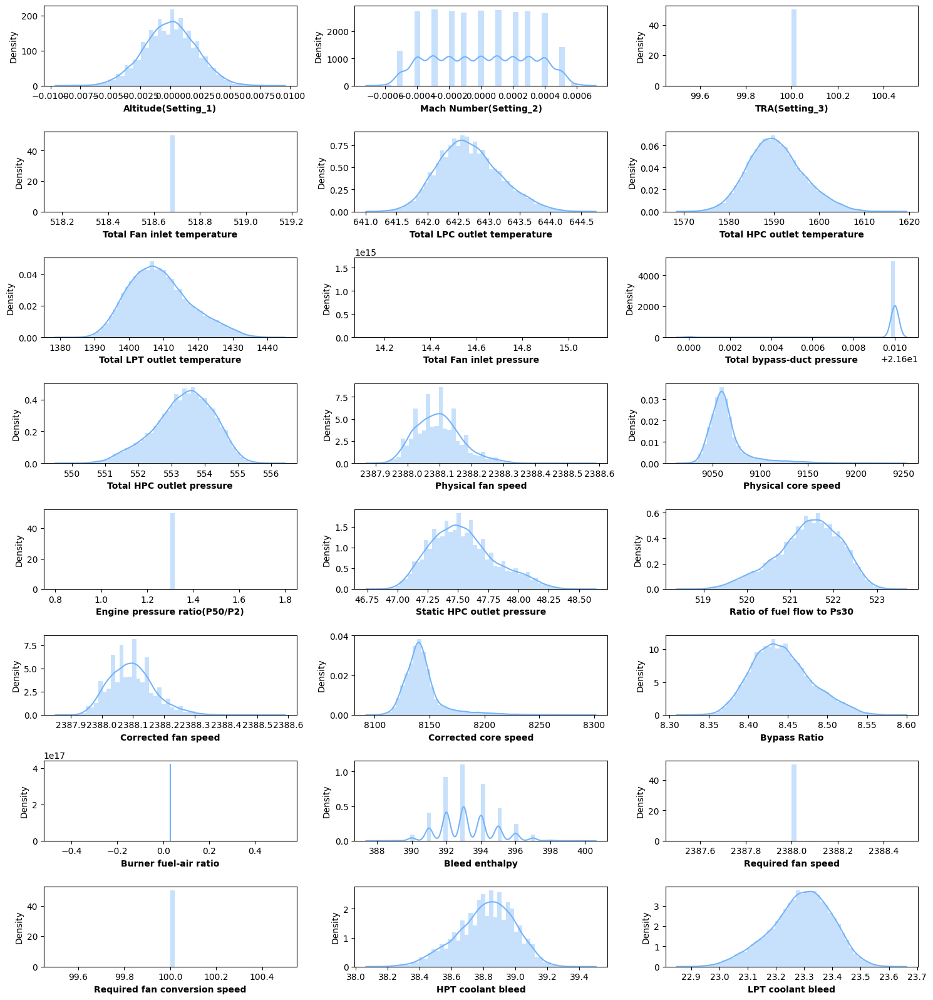

In [10]:
## Let's have a look at the distribution of sensors data for FD001_train
plt.figure(figsize=(15, 100))

for i, col in enumerate(FD001_train.columns[2:27]):
    plt.subplot(50, 3, i+1)
    sns.distplot(x=FD001_train[col], color='#73b3f9')
    plt.xlabel(col, weight='bold')
    plt.tight_layout()

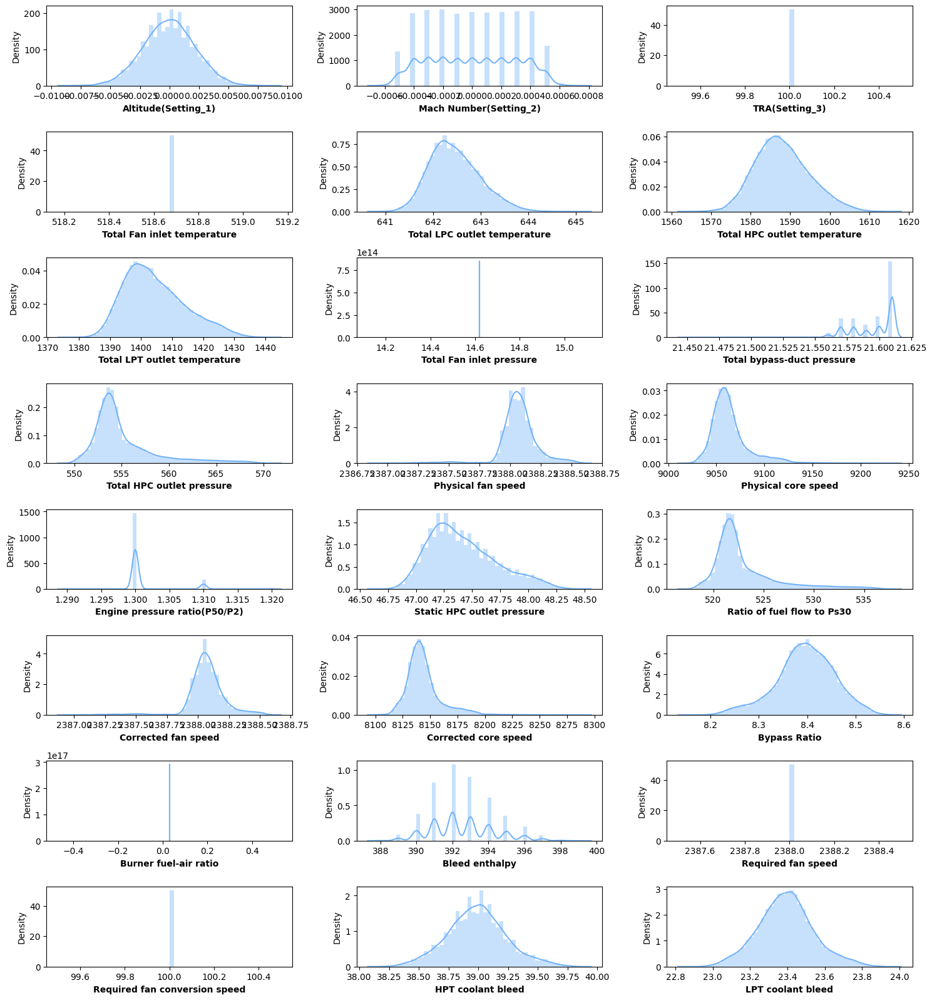

In [11]:
## Let's have a look at the distribution of sensors data for FD003_train
plt.figure(figsize=(15, 100))

for i, col in enumerate(FD003_train.columns[2:27]):
    plt.subplot(50, 3, i+1)
    sns.distplot(x=FD003_train[col], color='#73b3f9')
    plt.xlabel(col, weight='bold')
    plt.tight_layout()

In [12]:
### Let's find out the correlation between each and every feature for FD001_train
corr_df = FD001_train.corr(method="spearman")

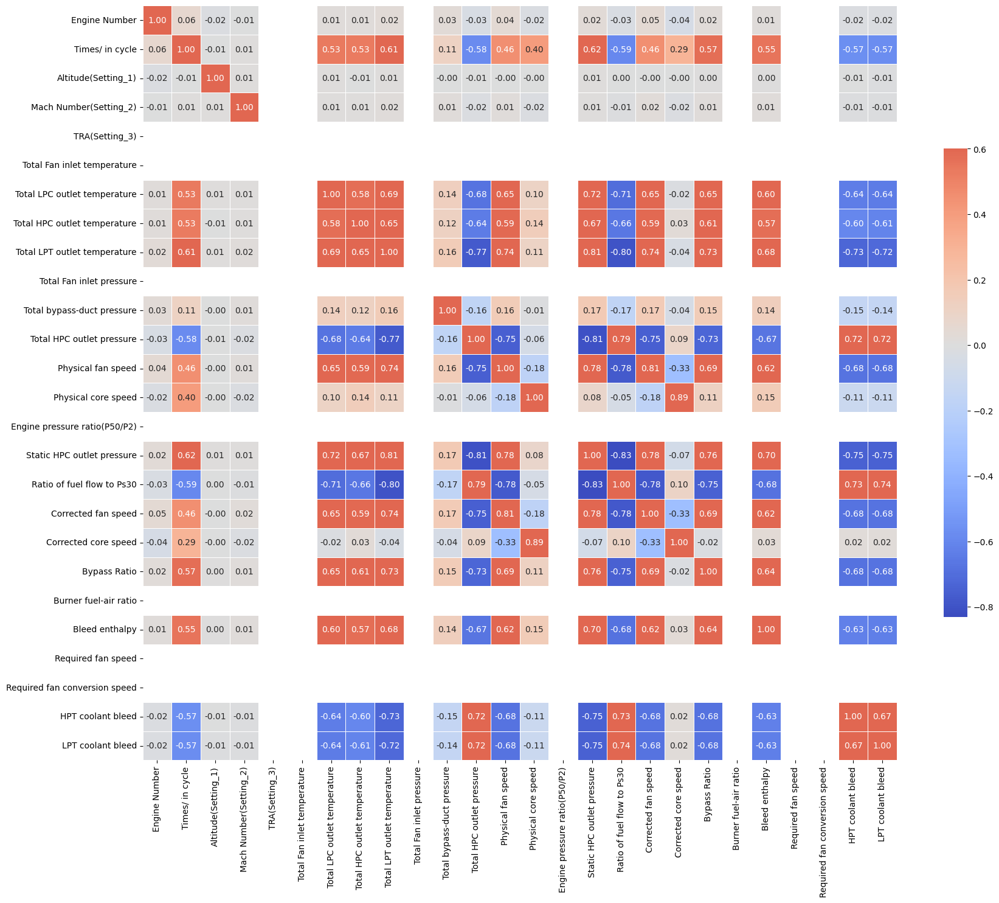

In [13]:
g = sns.heatmap(corr_df, vmax=.6, center=0,
               square=True, linewidths=.5, cbar_kws={"shrink":.5}, annot=True, fmt=".2f", cmap="coolwarm")
g.figure.set_size_inches(20,20)

plt.show()

In [14]:
### Let's find out the correlation between each and every feature for FD003_train
corr_df = FD003_train.corr(method="spearman")

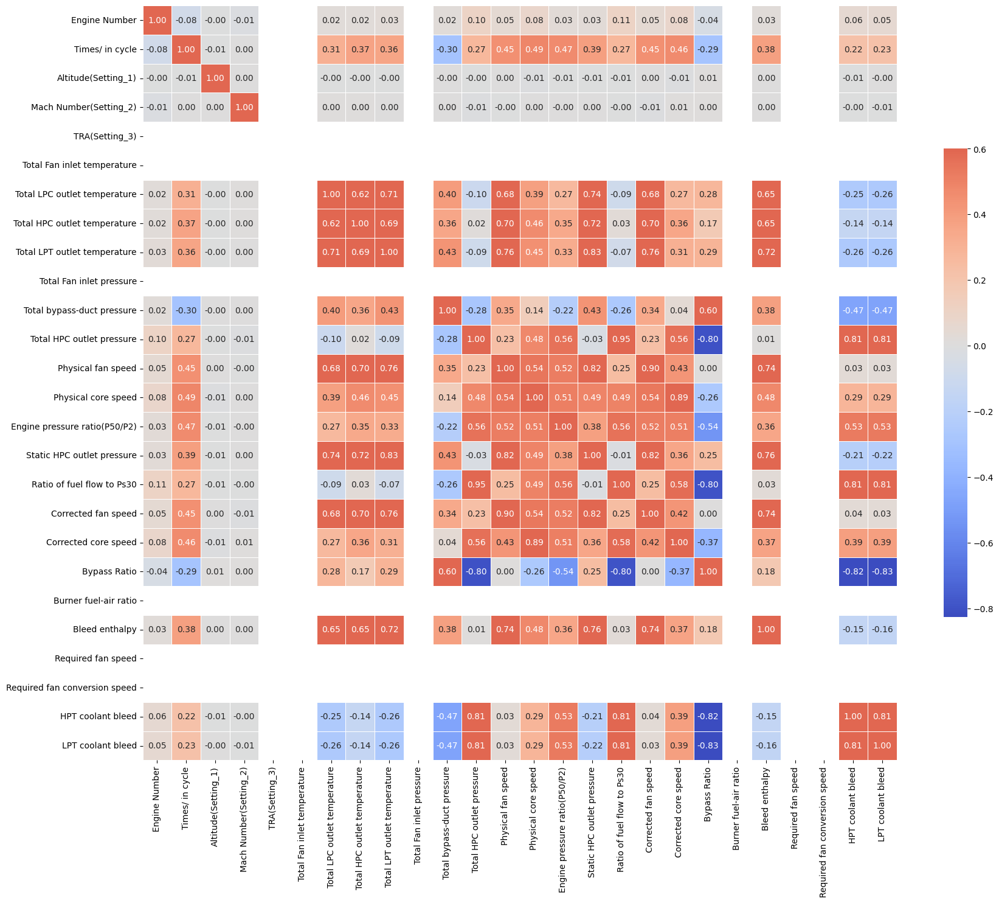

In [15]:
g = sns.heatmap(corr_df, vmax=.6, center=0,
               square=True, linewidths=.5, cbar_kws={"shrink":.5}, annot=True, fmt=".2f", cmap="coolwarm")
g.figure.set_size_inches(20,20)

plt.show()

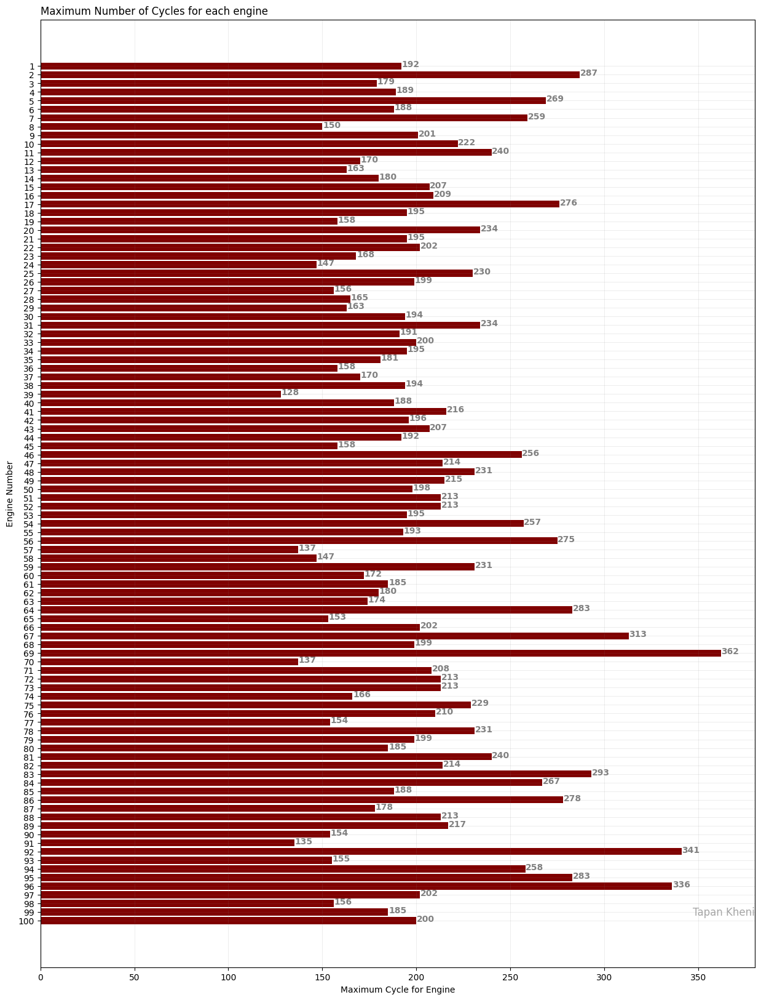

In [16]:
FD001_train_cy = FD001_train.groupby("Engine Number")[["Engine Number", "Times/ in cycle"]].max()

f, ax = plt.subplots(figsize=(15, 20))
sns.set_color_codes("pastel")

ax.barh("Engine Number", "Times/ in cycle", data=FD001_train_cy, color="maroon", tick_label=FD001_train_cy["Engine Number"])
plt.xlabel("Maximum Cycle for Engine")
plt.ylabel("Engine Number")
ax.grid(color="gray", alpha=0.2, linewidth=0.5)
for i in ax.patches:
    plt.text(i.get_width()+0.2, i.get_y()+0.5,
             str(round((i.get_width()), 2)),
             fontsize=10, fontweight='bold',
             color='grey')

ax.set_title("Maximum Number of Cycles for each engine", loc="left")
ax.invert_yaxis()

f.text(0.9, 0.15, 'Tapan Kheni', fontsize=12,
         color='grey', ha='right', va='bottom',
         alpha=0.7)
plt.show()

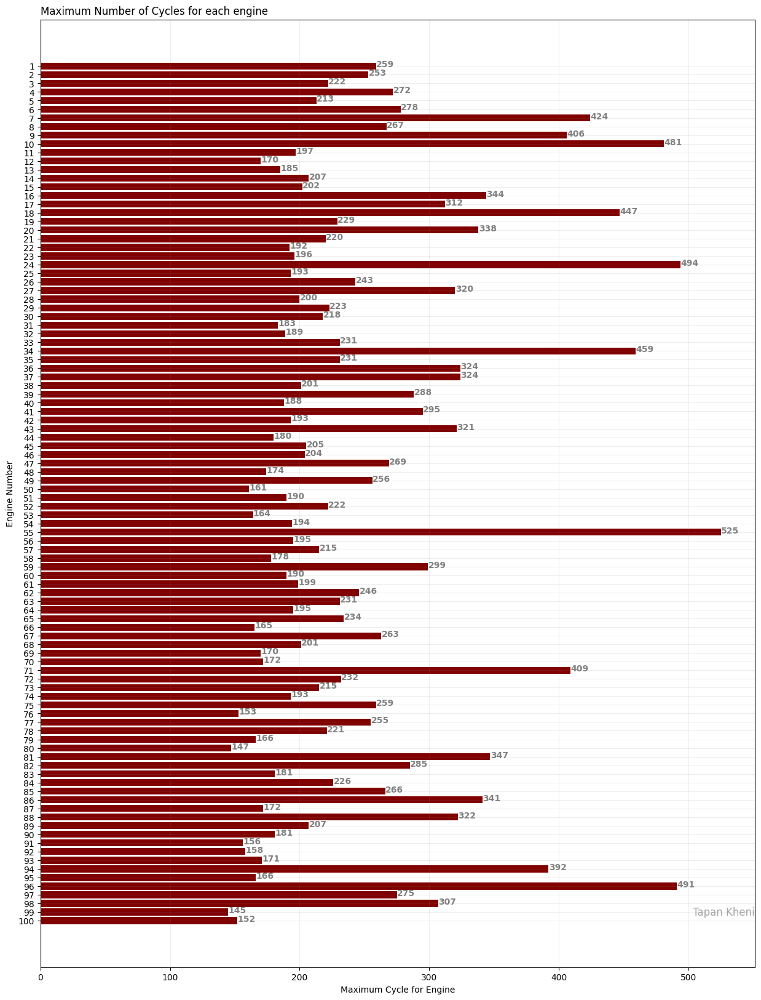

In [17]:
FD003_train_cy = FD003_train.groupby("Engine Number")[["Engine Number", "Times/ in cycle"]].max()

f, ax = plt.subplots(figsize=(15, 20))
sns.set_color_codes("pastel")

ax.barh("Engine Number", "Times/ in cycle", data=FD003_train_cy, color="maroon", tick_label=FD003_train_cy["Engine Number"])
plt.xlabel("Maximum Cycle for Engine")
plt.ylabel("Engine Number")
ax.grid(color="gray", alpha=0.2, linewidth=0.5)
for i in ax.patches:
    plt.text(i.get_width()+0.2, i.get_y()+0.5,
             str(round((i.get_width()), 2)),
             fontsize=10, fontweight='bold',
             color='grey')

ax.set_title("Maximum Number of Cycles for each engine", loc="left")
ax.invert_yaxis()

f.text(0.9, 0.15, 'Tapan Kheni', fontsize=12,
         color='grey', ha='right', va='bottom',
         alpha=0.7)
plt.show()

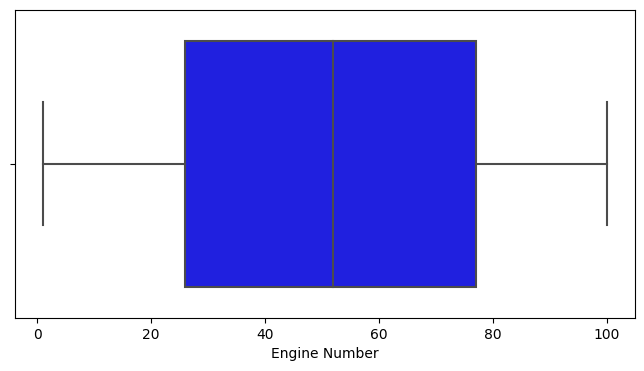

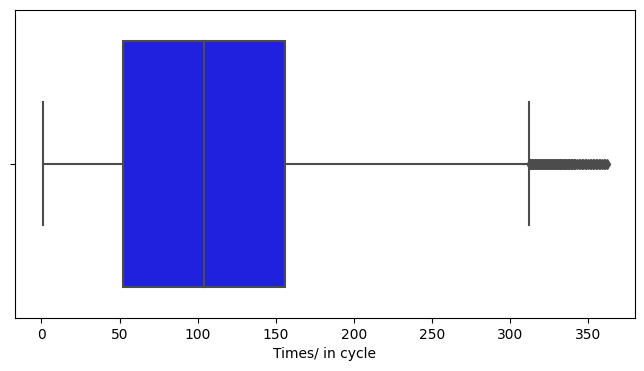

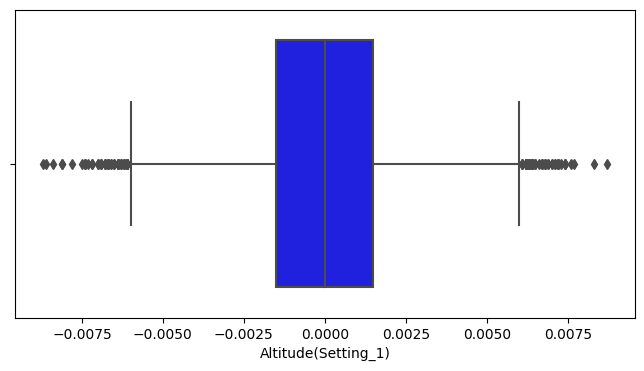

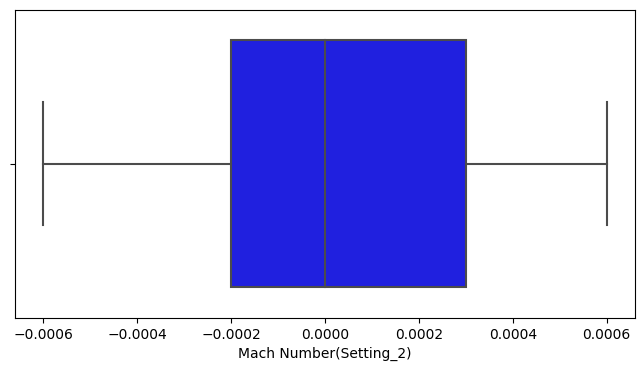

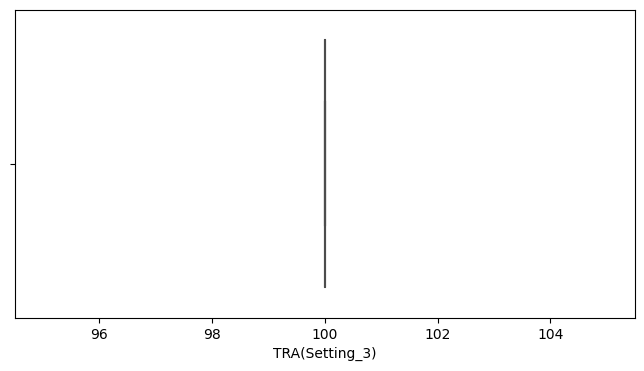

...

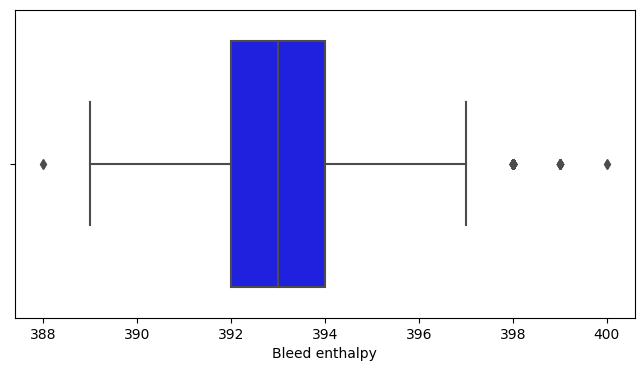

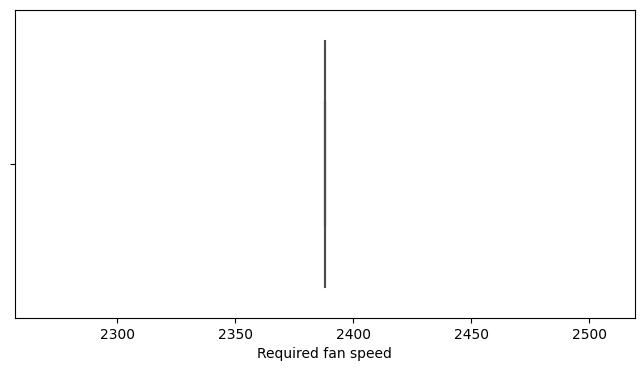

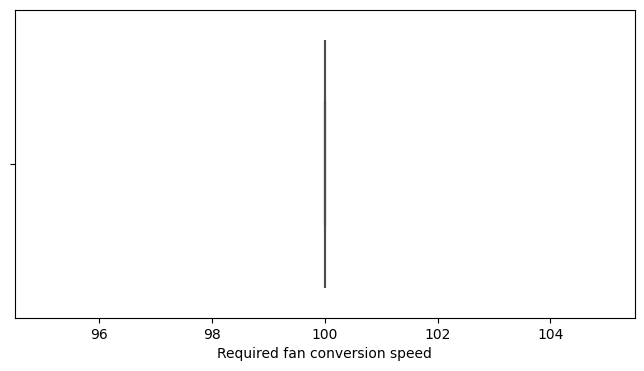

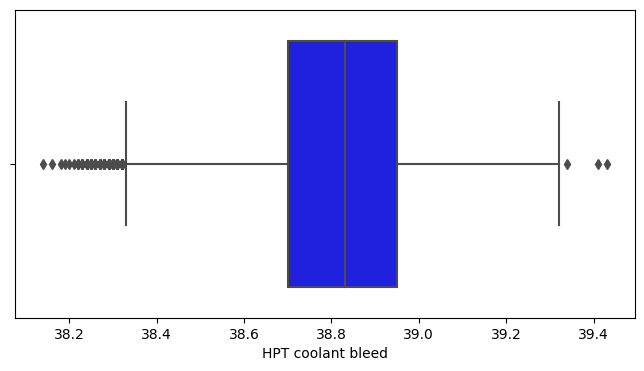

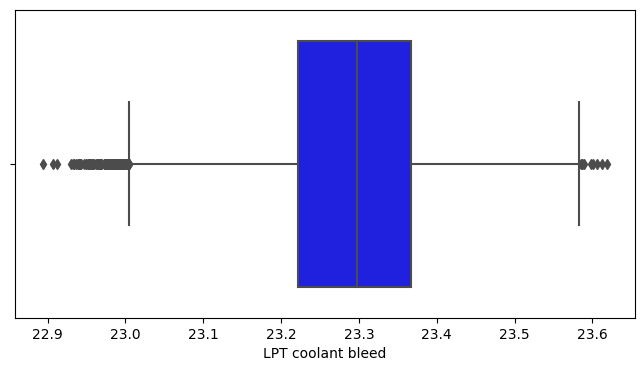

In [21]:
# Let's create boxplots to gain depper understanding of outliers for FD001_train
for i in FD001_train.select_dtypes(include=np.number):
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=FD001_train[i], color='blue')
    plt.show()

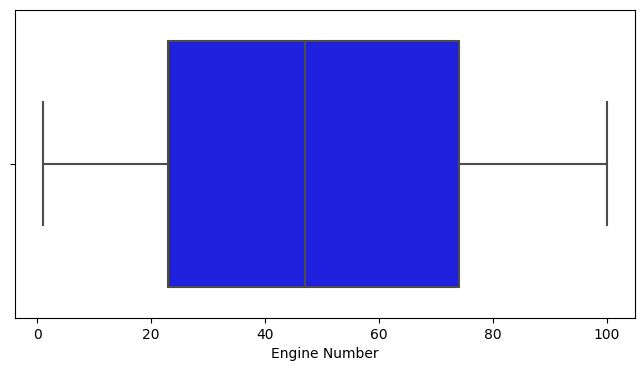

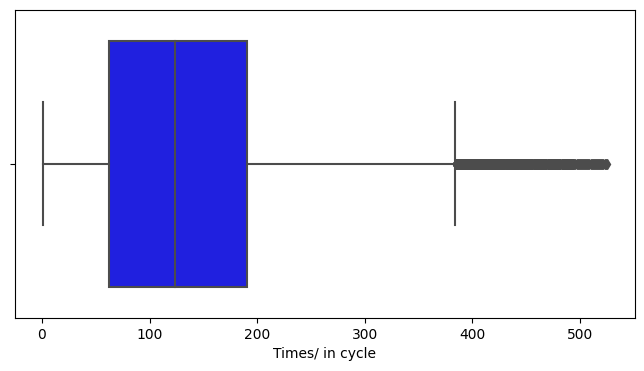

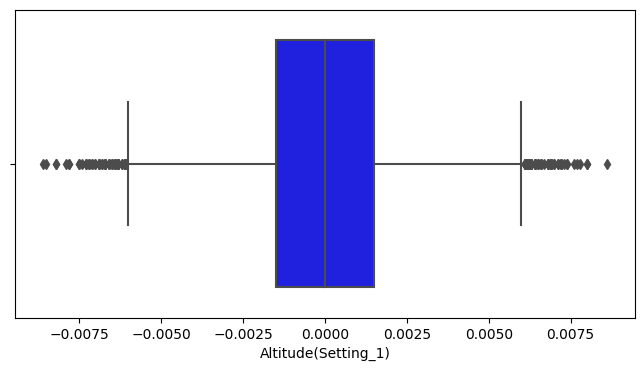

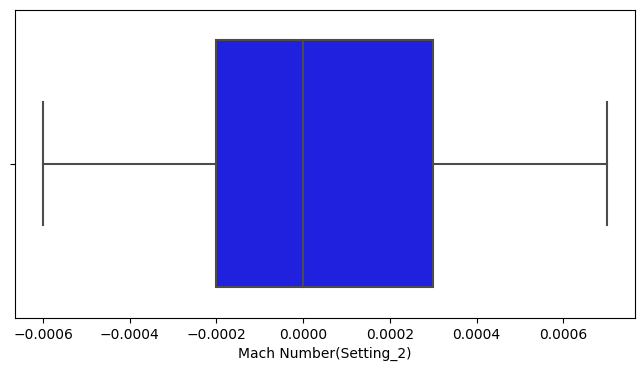

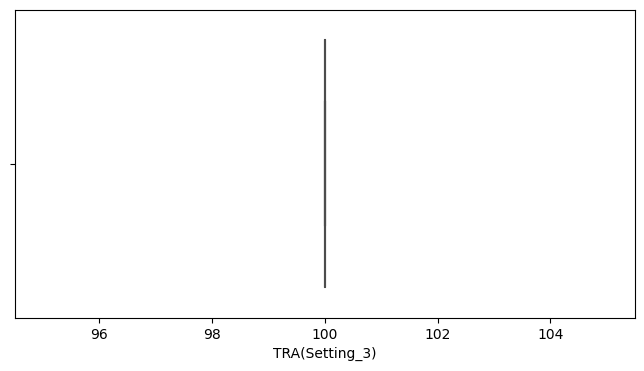

...

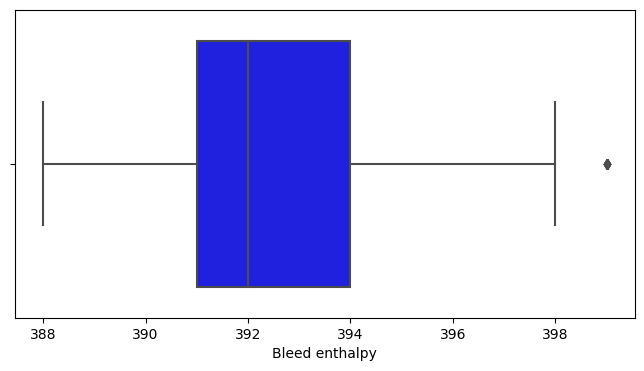

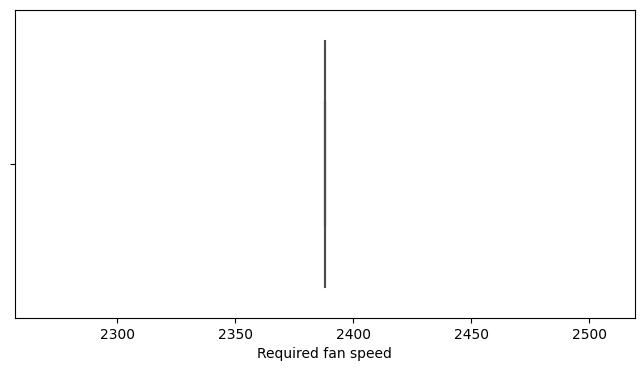

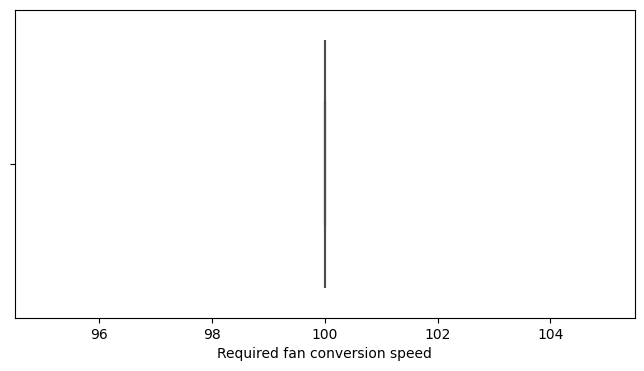

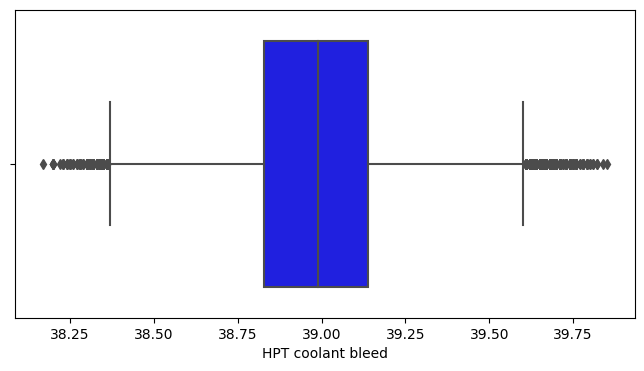

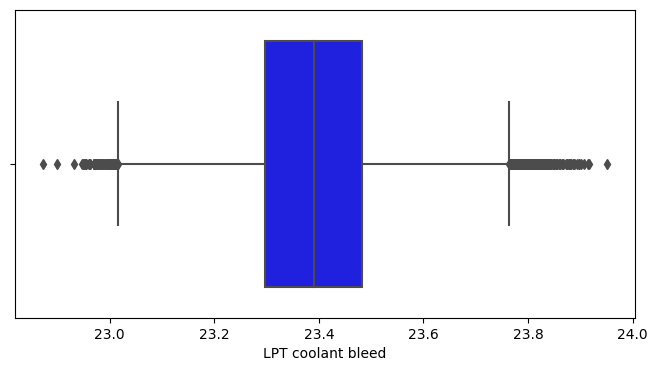

In [22]:
# Let's create boxplots to gain depper understanding of outliers for FD003_train
for i in FD003_train.select_dtypes(include=np.number):
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=FD003_train[i], color='blue')
    plt.show()

From the above mentioned boxplots we can say that there are outliers present, so it is for sure the data should be standardized.

For the features having standard deviation 0, we straight away drop them and for other who have outliers, we gonna use RobustScaler or other scaling techniques.

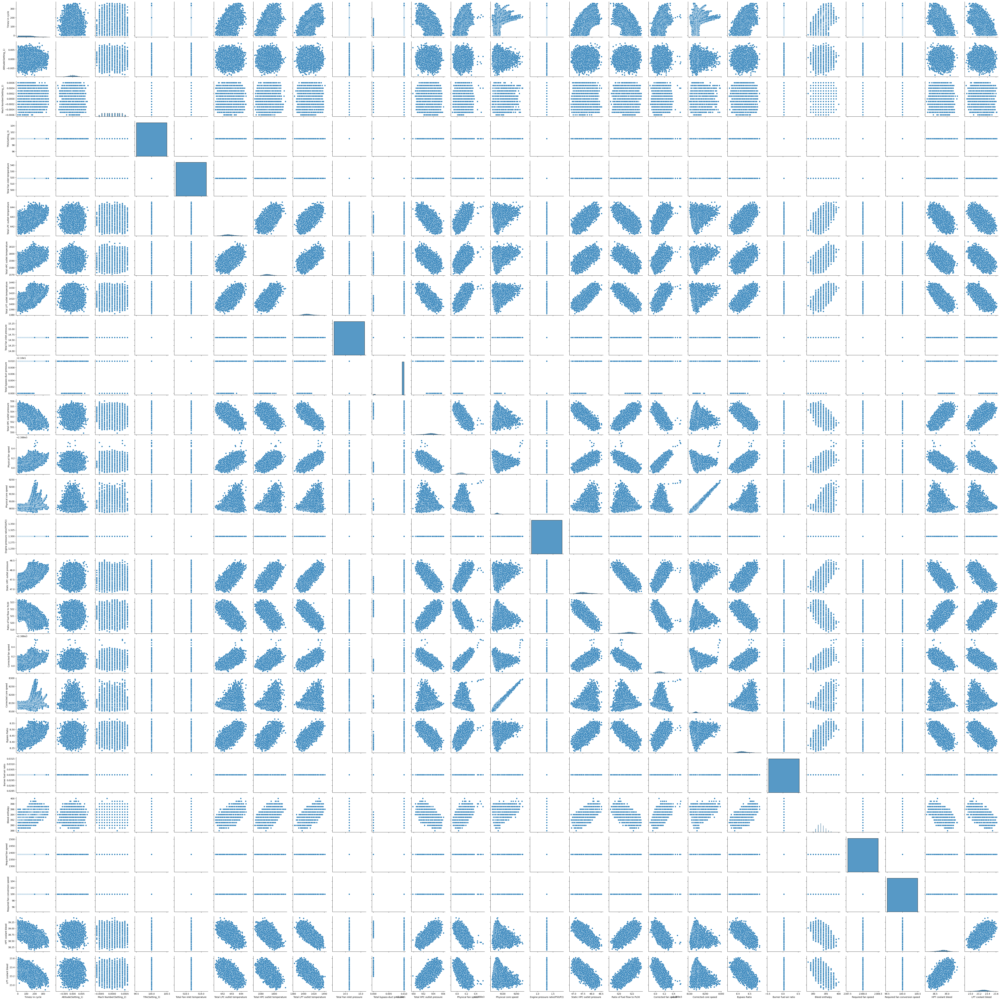

In [18]:
## Let's create pair plot
sns.pairplot(FD001_train.drop(columns=["Engine Number"], axis=1))

In [21]:
## Getting the features having zero std and missing values over certain threshold
def get_zero_std_features(df: pd.DataFrame):
    
    """Return a list of columns having std zero"""
    
    cols_to_drop = []
    cols_name = [col for col in df.columns if df[col].dtype != 'O']
    
    for col in cols_name:
        if df[col].std() == 0:
            cols_to_drop.append(col)
            
    return cols_to_drop

cols_to_drop_FD001 = get_zero_std_features(FD001_train)
cols_to_drop_FD001

['TRA(Setting_3)',
 'Total Fan inlet temperature',
 'Engine pressure ratio(P50/P2)',
 'Required fan speed',
 'Required fan conversion speed']

In [22]:
cols_to_drop_FD003 = get_zero_std_features(FD003_train)
cols_to_drop_FD003.extend(["Engine pressure ratio(P50/P2)"])
cols_to_drop_FD003

['TRA(Setting_3)',
 'Total Fan inlet temperature',
 'Required fan speed',
 'Required fan conversion speed',
 'Engine pressure ratio(P50/P2)']

In [23]:
FD001_train.drop(cols_to_drop_FD001, axis=1, inplace=True)
FD001_test.drop(cols_to_drop_FD001, axis=1, inplace=True)
FD001_train.head()

,Engine Number,Times/ in cycle,Altitude(Setting_1),Mach Number(Setting_2),Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total Fan inlet pressure,Total bypass-duct pressure,Total HPC outlet pressure,Physical fan speed,Physical core speed,Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Corrected core speed,Bypass Ratio,Burner fuel-air ratio,Bleed enthalpy,HPT coolant bleed,LPT coolant bleed
0,1,1,-0.0007,-0.0004,641.82,1589.70,1400.60,14.62,21.61,554.36,2388.06,9046.19,47.47,521.66,2388.02,8138.62,8.4195,0.03,392,39.06,23.4190
1,1,2,0.0019,-0.0003,642.15,1591.82,1403.14,14.62,21.61,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,0.03,392,39.00,23.4236
2,1,3,-0.0043,0.0003,642.35,1587.99,1404.20,14.62,21.61,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,0.03,390,38.95,23.3442
3,1,4,0.0007,0.0000,642.35,1582.79,1401.87,14.62,21.61,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,0.03,392,38.88,23.3739
4,1,5,-0.0019,-0.0002,642.37,1582.85,1406.22,14.62,21.61,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,0.03,393,38.90,23.4044


In [24]:
FD003_train.drop(cols_to_drop_FD003, axis=1, inplace=True)
FD003_test.drop(cols_to_drop_FD003, axis=1, inplace=True)
FD003_train.head()

,Engine Number,Times/ in cycle,Altitude(Setting_1),Mach Number(Setting_2),Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total Fan inlet pressure,Total bypass-duct pressure,Total HPC outlet pressure,Physical fan speed,Physical core speed,Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Corrected core speed,Bypass Ratio,Burner fuel-air ratio,Bleed enthalpy,HPT coolant bleed,LPT coolant bleed
0,1,1,-0.0005,0.0004,642.36,1583.23,1396.84,14.62,21.61,553.97,2387.96,9062.17,47.30,522.31,2388.01,8145.32,8.4246,0.03,391,39.11,23.3537
1,1,2,0.0008,-0.0003,642.50,1584.69,1396.89,14.62,21.61,554.55,2388.00,9061.78,47.23,522.42,2388.03,8152.85,8.4403,0.03,392,38.99,23.4491
2,1,3,-0.0014,-0.0002,642.18,1582.35,1405.61,14.62,21.61,554.43,2388.03,9070.23,47.22,522.03,2388.00,8150.17,8.3901,0.03,391,38.85,23.3669
3,1,4,-0.0020,0.0001,642.92,1585.61,1392.27,14.62,21.61,555.21,2388.00,9064.57,47.24,522.49,2388.08,8146.56,8.3878,0.03,392,38.96,23.2951
4,1,5,0.0016,0.0000,641.68,1588.63,1397.65,14.62,21.61,554.74,2388.04,9076.14,47.15,522.58,2388.03,8147.80,8.3869,0.03,392,39.14,23.4583


In [25]:
FD001_RUL_train = FD001_train.groupby("Engine Number").agg({"Times/ in cycle":"max"})
FD001_RUL_train.rename(columns={"Times/ in cycle": "total life"}, inplace=True)
FD001_RUL_train.head()

,total life
Engine Number,
1,192
2,287
3,179
4,189
5,269


In [26]:
FD001_train = FD001_train.merge(FD001_RUL_train, on=["Engine Number"], how="left")
FD001_train.head()

,Engine Number,Times/ in cycle,Altitude(Setting_1),Mach Number(Setting_2),Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total Fan inlet pressure,Total bypass-duct pressure,Total HPC outlet pressure,Physical fan speed,Physical core speed,Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Corrected core speed,Bypass Ratio,Burner fuel-air ratio,Bleed enthalpy,HPT coolant bleed,LPT coolant bleed,total life
0,1,1,-0.0007,-0.0004,641.82,1589.70,1400.60,14.62,21.61,554.36,2388.06,9046.19,47.47,521.66,2388.02,8138.62,8.4195,0.03,392,39.06,23.4190,192
1,1,2,0.0019,-0.0003,642.15,1591.82,1403.14,14.62,21.61,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,0.03,392,39.00,23.4236,192
2,1,3,-0.0043,0.0003,642.35,1587.99,1404.20,14.62,21.61,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,0.03,390,38.95,23.3442,192
3,1,4,0.0007,0.0000,642.35,1582.79,1401.87,14.62,21.61,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,0.03,392,38.88,23.3739,192
4,1,5,-0.0019,-0.0002,642.37,1582.85,1406.22,14.62,21.61,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,0.03,393,38.90,23.4044,192


In [27]:
FD001_train["RUL"] = FD001_train["total life"] - FD001_train["Times/ in cycle"]
FD001_train.drop(["total life"], axis=1, inplace=True)
FD001_train.head()

,Engine Number,Times/ in cycle,Altitude(Setting_1),Mach Number(Setting_2),Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total Fan inlet pressure,Total bypass-duct pressure,Total HPC outlet pressure,Physical fan speed,Physical core speed,Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Corrected core speed,Bypass Ratio,Burner fuel-air ratio,Bleed enthalpy,HPT coolant bleed,LPT coolant bleed,RUL
0,1,1,-0.0007,-0.0004,641.82,1589.70,1400.60,14.62,21.61,554.36,2388.06,9046.19,47.47,521.66,2388.02,8138.62,8.4195,0.03,392,39.06,23.4190,191
1,1,2,0.0019,-0.0003,642.15,1591.82,1403.14,14.62,21.61,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,0.03,392,39.00,23.4236,190
2,1,3,-0.0043,0.0003,642.35,1587.99,1404.20,14.62,21.61,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,0.03,390,38.95,23.3442,189
3,1,4,0.0007,0.0000,642.35,1582.79,1401.87,14.62,21.61,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,0.03,392,38.88,23.3739,188
4,1,5,-0.0019,-0.0002,642.37,1582.85,1406.22,14.62,21.61,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,0.03,393,38.90,23.4044,187


In [28]:
FD003_RUL_train = FD003_train.groupby("Engine Number").agg({"Times/ in cycle":"max"})
FD003_RUL_train.rename(columns={"Times/ in cycle": "total life"}, inplace=True)
FD003_RUL_train.head()

,total life
Engine Number,
1,259
2,253
3,222
4,272
5,213


In [29]:
FD003_train = FD003_train.merge(FD003_RUL_train, on=["Engine Number"], how="left")
FD003_train.head()

,Engine Number,Times/ in cycle,Altitude(Setting_1),Mach Number(Setting_2),Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total Fan inlet pressure,Total bypass-duct pressure,Total HPC outlet pressure,Physical fan speed,Physical core speed,Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Corrected core speed,Bypass Ratio,Burner fuel-air ratio,Bleed enthalpy,HPT coolant bleed,LPT coolant bleed,total life
0,1,1,-0.0005,0.0004,642.36,1583.23,1396.84,14.62,21.61,553.97,2387.96,9062.17,47.30,522.31,2388.01,8145.32,8.4246,0.03,391,39.11,23.3537,259
1,1,2,0.0008,-0.0003,642.50,1584.69,1396.89,14.62,21.61,554.55,2388.00,9061.78,47.23,522.42,2388.03,8152.85,8.4403,0.03,392,38.99,23.4491,259
2,1,3,-0.0014,-0.0002,642.18,1582.35,1405.61,14.62,21.61,554.43,2388.03,9070.23,47.22,522.03,2388.00,8150.17,8.3901,0.03,391,38.85,23.3669,259
3,1,4,-0.0020,0.0001,642.92,1585.61,1392.27,14.62,21.61,555.21,2388.00,9064.57,47.24,522.49,2388.08,8146.56,8.3878,0.03,392,38.96,23.2951,259
4,1,5,0.0016,0.0000,641.68,1588.63,1397.65,14.62,21.61,554.74,2388.04,9076.14,47.15,522.58,2388.03,8147.80,8.3869,0.03,392,39.14,23.4583,259


In [ ]:
FD003_train["RUL"] = FD003_train["total life"] - FD003_train["Times/ in cycle"]
FD003_train.drop(["total life"], axis=1, inplace=True)
FD003_train.head()

In [31]:
## Correlation of each feature with respect to Dependent feature RUL for FD001_train
FD001_train.corr(method="spearman")["RUL"].sort_values()

Times/ in cycle                -0.786844
Static HPC outlet pressure     -0.718132
Total LPT outlet temperature   -0.701771
Bypass Ratio                   -0.665905
Bleed enthalpy                 -0.629397
Total LPC outlet temperature   -0.628588
Total HPC outlet temperature   -0.605609
Physical fan speed             -0.573864
Corrected fan speed            -0.572549
Physical core speed            -0.322014
Corrected core speed           -0.201792
Total bypass-duct pressure     -0.128070
Mach Number(Setting_2)         -0.003776
Altitude(Setting_1)            -0.001332
Engine Number                   0.057624
HPT coolant bleed               0.653336
LPT coolant bleed               0.657417
Total HPC outlet pressure       0.678845
Ratio of fuel flow to Ps30      0.693149
RUL                             1.000000
Total Fan inlet pressure             NaN
Burner fuel-air ratio                NaN
Name: RUL, dtype: float64

In [35]:
## Correlation of each feature with respect to Dependent feature RUL for FD003_train
FD003_train.corr(method="spearman")["RUL"].sort_values()

Static HPC outlet pressure     -0.688915
Total LPT outlet temperature   -0.657224
Corrected fan speed            -0.656340
Physical fan speed             -0.655345
Bleed enthalpy                 -0.649220
Total HPC outlet temperature   -0.624236
Total LPC outlet temperature   -0.590564
Physical core speed            -0.551843
Times/ in cycle                -0.482744
Corrected core speed           -0.481807
Ratio of fuel flow to Ps30     -0.329452
Total HPC outlet pressure      -0.315048
Total bypass-duct pressure     -0.215352
Engine Number                  -0.077196
Bypass Ratio                   -0.016501
Mach Number(Setting_2)         -0.001204
Altitude(Setting_1)             0.003700
LPT coolant bleed               0.033465
HPT coolant bleed               0.037782
RUL                             1.000000
Total Fan inlet pressure             NaN
Burner fuel-air ratio                NaN
Name: RUL, dtype: float64

In [36]:
## Dropping more features that doesn't have the good correlation with RUL
## Important columns according to me
important_cols = ['Engine Number', 'Times/ in cycle', 'Total LPC outlet temperature', 'Total HPC outlet temperature',
                  'Total LPT outlet temperature', 'Total HPC outlet pressure', 'Physical fan speed', 'Physical core speed', 'Static HPC outlet pressure',
                  'Ratio of fuel flow to Ps30', 'Corrected fan speed', 'Bypass Ratio', 'Bleed enthalpy', 'HPT coolant bleed', 'LPT coolant bleed']
## Another feature that can be droped
drop_cols = ["Corrected core speed", "Total bypass-duct pressure", "Altitude(Setting_1)", "Mach Number(Setting_2)", "Total Fan inlet pressure", 
             "Burner fuel-air ratio"]

## This conclusion is based correlation of features with respect to RUL (Dependent feature)

In [37]:
FD001_train.drop(columns=drop_cols, axis=1, inplace=True)
FD001_test.drop(columns=drop_cols, axis=1, inplace=True)
FD001_train.head()

,Engine Number,Times/ in cycle,Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total HPC outlet pressure,Physical fan speed,Physical core speed,Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Bypass Ratio,Bleed enthalpy,HPT coolant bleed,LPT coolant bleed,RUL
0,1,1,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.47,521.66,2388.02,8.4195,392,39.06,23.4190,191
1,1,2,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8.4318,392,39.00,23.4236,190
2,1,3,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8.4178,390,38.95,23.3442,189
3,1,4,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8.3682,392,38.88,23.3739,188
4,1,5,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8.4294,393,38.90,23.4044,187


In [38]:
FD003_train.drop(columns=drop_cols, axis=1, inplace=True)
FD003_test.drop(columns=drop_cols, axis=1, inplace=True)
FD003_train.head()

,Engine Number,Times/ in cycle,Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total HPC outlet pressure,Physical fan speed,Physical core speed,Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Bypass Ratio,Bleed enthalpy,HPT coolant bleed,LPT coolant bleed,RUL
0,1,1,642.36,1583.23,1396.84,553.97,2387.96,9062.17,47.30,522.31,2388.01,8.4246,391,39.11,23.3537,258
1,1,2,642.50,1584.69,1396.89,554.55,2388.00,9061.78,47.23,522.42,2388.03,8.4403,392,38.99,23.4491,257
2,1,3,642.18,1582.35,1405.61,554.43,2388.03,9070.23,47.22,522.03,2388.00,8.3901,391,38.85,23.3669,256
3,1,4,642.92,1585.61,1392.27,555.21,2388.00,9064.57,47.24,522.49,2388.08,8.3878,392,38.96,23.2951,255
4,1,5,641.68,1588.63,1397.65,554.74,2388.04,9076.14,47.15,522.58,2388.03,8.3869,392,39.14,23.4583,254


**Model Training and Model Evaluation**

In [39]:
import time
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, make_scorer, accuracy_score

In [40]:
FD001_test_cycle = FD001_test.groupby(["Engine Number"]).agg({"Times/ in cycle":"max"})
FD001_test_cycle.rename(columns={"Times/ in cycle":"life"}, inplace=True)
# print(df_FD001_test_cycle)

FD001_test = FD001_test.merge(FD001_test_cycle, how="left", on=["Engine Number"])
FD001_test.head()

,Engine Number,Times/ in cycle,Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total HPC outlet pressure,Physical fan speed,Physical core speed,Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Bypass Ratio,Bleed enthalpy,HPT coolant bleed,LPT coolant bleed,life
0,1,1,643.02,1585.29,1398.21,553.90,2388.04,9050.17,47.20,521.72,2388.03,8.4052,392,38.86,23.3735,31
1,1,2,641.71,1588.45,1395.42,554.85,2388.01,9054.42,47.50,522.16,2388.06,8.3803,393,39.02,23.3916,31
2,1,3,642.46,1586.94,1401.34,554.11,2388.05,9056.96,47.50,521.97,2388.03,8.4441,393,39.08,23.4166,31
3,1,4,642.44,1584.12,1406.42,554.07,2388.03,9045.29,47.28,521.38,2388.05,8.3917,391,39.00,23.3737,31
4,1,5,642.51,1587.19,1401.92,554.16,2388.01,9044.55,47.31,522.15,2388.03,8.4031,390,38.99,23.4130,31


In [41]:
FD001_test = FD001_test[(FD001_test["Times/ in cycle"] == FD001_test["life"])]
FD001_test.drop(["life"], axis=1, inplace=True)

In [42]:
FD003_test_cycle = FD003_test.groupby(["Engine Number"]).agg({"Times/ in cycle":"max"})
FD003_test_cycle.rename(columns={"Times/ in cycle":"life"}, inplace=True)
# print(df_FD001_test_cycle)

FD003_test = FD003_test.merge(FD003_test_cycle, how="left", on=["Engine Number"])
FD003_test.head()

,Engine Number,Times/ in cycle,Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total HPC outlet pressure,Physical fan speed,Physical core speed,Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Bypass Ratio,Bleed enthalpy,HPT coolant bleed,LPT coolant bleed,life
0,1,1,641.94,1581.93,1396.93,554.56,2387.93,9048.65,47.09,521.89,2387.94,8.3760,391,39.07,23.4468,233
1,1,2,642.02,1584.86,1398.90,554.10,2387.94,9046.53,47.08,521.85,2388.01,8.4062,391,39.04,23.4807,233
2,1,3,641.68,1581.78,1391.92,554.41,2387.97,9054.92,47.15,522.10,2387.94,8.3553,391,39.10,23.4244,233
3,1,4,642.20,1584.53,1395.34,554.58,2387.94,9055.04,47.26,522.45,2387.96,8.3709,392,38.97,23.4782,233
4,1,5,642.46,1589.03,1395.86,554.16,2388.01,9048.59,46.94,521.91,2387.97,8.4146,391,39.09,23.3950,233


In [43]:
FD003_test = FD003_test[(FD003_test["Times/ in cycle"] == FD003_test["life"])]
FD003_test.drop(["life"], axis=1, inplace=True)

In [44]:
FD001_test.head()

,Engine Number,Times/ in cycle,Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total HPC outlet pressure,Physical fan speed,Physical core speed,Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Bypass Ratio,Bleed enthalpy,HPT coolant bleed,LPT coolant bleed
30,1,31,642.58,1581.22,1398.91,554.42,2388.08,9056.40,47.23,521.79,2388.06,8.4024,393,38.81,23.3552
79,2,49,642.55,1586.59,1410.83,553.52,2388.10,9044.77,47.67,521.74,2388.09,8.4505,391,38.81,23.2618
205,3,126,642.88,1589.75,1418.89,552.59,2388.16,9049.26,47.88,520.83,2388.14,8.4119,395,38.93,23.2740
311,4,106,642.78,1594.53,1406.88,552.64,2388.13,9051.30,47.65,521.88,2388.11,8.4634,395,38.58,23.2581
409,5,98,642.27,1589.94,1419.36,553.29,2388.10,9053.99,47.46,521.00,2388.15,8.4362,394,38.75,23.4117


In [45]:
FD003_test.head()

,Engine Number,Times/ in cycle,Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total HPC outlet pressure,Physical fan speed,Physical core speed,Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Bypass Ratio,Bleed enthalpy,HPT coolant bleed,LPT coolant bleed
232,1,233,642.59,1592.40,1409.87,560.53,2388.22,9085.50,47.53,528.05,2388.23,8.2966,393,39.43,23.5679
356,2,124,642.56,1587.42,1409.69,553.33,2388.18,9050.97,47.71,520.90,2388.17,8.4514,392,38.83,23.2821
590,3,234,642.75,1591.93,1417.66,563.61,2388.31,9091.69,47.68,531.36,2388.33,8.3057,395,39.27,23.6440
658,4,68,642.28,1584.68,1406.56,552.75,2388.07,9048.23,47.26,521.27,2388.09,8.4337,392,38.70,23.3804
796,5,138,642.15,1580.59,1397.26,553.82,2387.96,9050.89,47.09,521.74,2387.96,8.3900,390,38.89,23.4463


In [46]:
FD001_train.drop(columns=["Engine Number"], axis=1, inplace=True)
FD001_test.drop(columns=["Engine Number"], axis=1, inplace=True)
FD003_train.drop(columns=["Engine Number"], axis=1, inplace=True)
FD003_test.drop(columns=["Engine Number"], axis=1, inplace=True)

In [47]:
FD001_train.head()

,Times/ in cycle,Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total HPC outlet pressure,Physical fan speed,Physical core speed,Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Bypass Ratio,Bleed enthalpy,HPT coolant bleed,LPT coolant bleed,RUL
0,1,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.47,521.66,2388.02,8.4195,392,39.06,23.4190,191
1,2,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8.4318,392,39.00,23.4236,190
2,3,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8.4178,390,38.95,23.3442,189
3,4,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8.3682,392,38.88,23.3739,188
4,5,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8.4294,393,38.90,23.4044,187


In [48]:
FD003_train.head()

,Times/ in cycle,Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total HPC outlet pressure,Physical fan speed,Physical core speed,Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Bypass Ratio,Bleed enthalpy,HPT coolant bleed,LPT coolant bleed,RUL
0,1,642.36,1583.23,1396.84,553.97,2387.96,9062.17,47.30,522.31,2388.01,8.4246,391,39.11,23.3537,258
1,2,642.50,1584.69,1396.89,554.55,2388.00,9061.78,47.23,522.42,2388.03,8.4403,392,38.99,23.4491,257
2,3,642.18,1582.35,1405.61,554.43,2388.03,9070.23,47.22,522.03,2388.00,8.3901,391,38.85,23.3669,256
3,4,642.92,1585.61,1392.27,555.21,2388.00,9064.57,47.24,522.49,2388.08,8.3878,392,38.96,23.2951,255
4,5,641.68,1588.63,1397.65,554.74,2388.04,9076.14,47.15,522.58,2388.03,8.3869,392,39.14,23.4583,254


In [49]:
print(f"FD001_test columns:\n{FD001_test.columns}\n")
print(f"FD003_test columns:\n{FD003_test.columns}\n")

FD001_test columns:
Index(['Times/ in cycle', 'Total LPC outlet temperature', 'Total HPC outlet temperature', 'Total LPT outlet temperature', 'Total HPC outlet pressure', 'Physical fan speed', 'Physical core speed', 'Static HPC outlet pressure', 'Ratio of fuel flow to Ps30', 'Corrected fan speed', 'Bypass Ratio', 'Bleed enthalpy', 'HPT coolant bleed', 'LPT coolant bleed'], dtype='object')

FD003_test columns:
Index(['Times/ in cycle', 'Total LPC outlet temperature', 'Total HPC outlet temperature', 'Total LPT outlet temperature', 'Total HPC outlet pressure', 'Physical fan speed', 'Physical core speed', 'Static HPC outlet pressure', 'Ratio of fuel flow to Ps30', 'Corrected fan speed', 'Bypass Ratio', 'Bleed enthalpy', 'HPT coolant bleed', 'LPT coolant bleed'], dtype='object')



In [50]:
## Spliting train and test data for FD001_train
X_train_FD001 = FD001_train.iloc[:,:-1]
y_train_FD001 = FD001_train.iloc[:,-1]
X_test_FD001 = FD001_test.iloc[:,:len(FD001_test.columns)+1]
y_test_FD001 = RUL_FD001.iloc[:,-1]

In [51]:
## Spliting train and test data for FD003_train
X_train_FD003 = FD003_train.iloc[:,:-1]
y_train_FD003 = FD003_train.iloc[:,-1]
X_test_FD003 = FD003_test.iloc[:,:len(FD003_test.columns)+1]
y_test_FD003 = RUL_FD003.iloc[:,-1]

In [52]:
print(f"X_train_FD001 shape: {X_train_FD001.shape}\n")
print(f"y_train_FD001 shape: {y_train_FD001.shape}\n")
print(f"X_test_FD001 shape: {X_test_FD001.shape}\n")
print(f"y_test_FD001 shape: {y_test_FD001.shape}\n")

X_train_FD001 shape: (20631, 14)

y_train_FD001 shape: (20631,)

X_test_FD001 shape: (100, 14)

y_test_FD001 shape: (100,)



In [53]:
print(f"X_train_FD003 shape: {X_train_FD003.shape}\n")
print(f"y_train_FD003 shape: {y_train_FD003.shape}\n")
print(f"X_test_FD003 shape: {X_test_FD003.shape}\n")
print(f"y_test_FD003 shape: {y_test_FD003.shape}\n")

X_train_FD003 shape: (24720, 14)

y_train_FD003 shape: (24720,)

X_test_FD003 shape: (100, 14)

y_test_FD003 shape: (100,)



In [56]:
X_train = pd.concat([X_train_FD001, X_train_FD003])
y_train = pd.concat([y_train_FD001, y_train_FD003])
X_test = pd.concat([X_test_FD001, X_test_FD003])
y_test = pd.concat([y_test_FD001, y_test_FD003])

In [57]:
print(f"X_train shape: {X_train.shape}\n")
print(f"y_train shape: {y_train.shape}\n")
print(f"X_test shape: {X_test.shape}\n")
print(f"y_test shape: {y_test.shape}\n")

X_train shape: (45351, 14)

y_train shape: (45351,)

X_test shape: (200, 14)

y_test shape: (200,)



In [58]:
X_train.head()

,Times/ in cycle,Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total HPC outlet pressure,Physical fan speed,Physical core speed,Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Bypass Ratio,Bleed enthalpy,HPT coolant bleed,LPT coolant bleed
0,1,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.47,521.66,2388.02,8.4195,392,39.06,23.4190
1,2,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8.4318,392,39.00,23.4236
2,3,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8.4178,390,38.95,23.3442
3,4,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8.3682,392,38.88,23.3739
4,5,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8.4294,393,38.90,23.4044


In [59]:
y_train.head()

0    191
1    190
2    189
3    188
4    187
Name: RUL, dtype: int64

**Scaling the data to overcome the problem of outliers**

In [60]:
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

numerical_columns = list(X_train.columns[1:])


preprocessor = ColumnTransformer(
    transformers=[
        ("Numeric", RobustScaler(), numerical_columns)
    ],
    remainder='passthrough'
)
preprocessor_pipeline = Pipeline(
    steps=[
        ("preprocessor", preprocessor)
    ]
)
preprocessor_pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('Numeric', RobustScaler(),
                                                  ['Total LPC outlet '
                                                   'temperature',
                                                   'Total HPC outlet '
                                                   'temperature',
                                                   'Total LPT outlet '
                                                   'temperature',
                                                   'Total HPC outlet pressure',
                                                   'Physical fan speed',
                                                   'Physical core speed',
                                                   'Static HPC outlet pressure',
                                                   'Ratio of fuel flow to Ps30',
                                                   'Corrected fan speed',
                                                   'Bypass Ratio',
                                                   'Bleed enthalpy',
                                                   'HPT coolant bleed',
                                                   'LPT coolant bleed'])]))])

In [61]:
cols_names = list(X_train.columns[1:])
cols_names.extend(["Times/ in cycle"])
cols_names

['Total LPC outlet temperature',
 'Total HPC outlet temperature',
 'Total LPT outlet temperature',
 'Total HPC outlet pressure',
 'Physical fan speed',
 'Physical core speed',
 'Static HPC outlet pressure',
 'Ratio of fuel flow to Ps30',
 'Corrected fan speed',
 'Bypass Ratio',
 'Bleed enthalpy',
 'HPT coolant bleed',
 'LPT coolant bleed',
 'Times/ in cycle']

In [62]:
X_train = pd.DataFrame(preprocessor_pipeline.fit_transform(X_train), columns=cols_names)
X_test = pd.DataFrame(preprocessor_pipeline.transform(X_test), columns=cols_names)

In [75]:
X_train.head()

,Total LPC outlet temperature,Total HPC outlet temperature,Total LPT outlet temperature,Total HPC outlet pressure,Physical fan speed,Physical core speed,Static HPC outlet pressure,Ratio of fuel flow to Ps30,Corrected fan speed,Bypass Ratio,Bleed enthalpy,HPT coolant bleed,LPT coolant bleed,Times/ in cycle
0,-0.972222,0.101466,-0.365599,0.409938,-0.166667,-0.816244,0.073171,-0.014706,-0.500000,-0.026746,-0.5,0.551724,0.436219,1.0
1,-0.513889,0.340474,-0.176471,0.031056,-0.333333,-0.938364,0.121951,0.441176,-0.083333,0.156018,-0.5,0.344828,0.462415,2.0
2,-0.236111,-0.091319,-0.097543,0.347826,0.000000,-0.427419,-0.414634,0.544118,-0.416667,-0.052006,-1.5,0.172414,0.010251,3.0
3,-0.236111,-0.677565,-0.271035,0.465839,0.250000,-0.626728,-0.756098,0.867647,0.000000,-0.789004,-0.5,-0.068966,0.179385,4.0
4,-0.208333,-0.670800,0.052867,0.186335,-0.166667,-0.300115,-0.390244,0.375000,-0.333333,0.120357,0.0,0.000000,0.353075,5.0


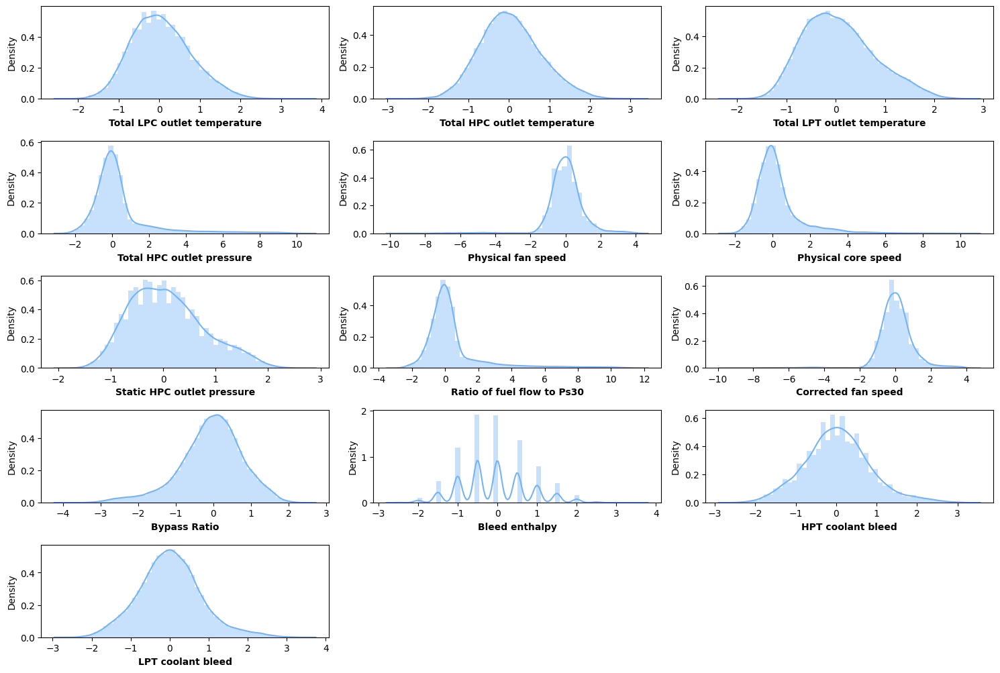

In [76]:
## Let's have a look at the distribution of sensors data for X_train
plt.figure(figsize=(15, 100))

for i, col in enumerate(X_train.columns[0:13]):
    plt.subplot(50, 3, i+1)
    sns.distplot(x=X_train[col], color='#73b3f9')
    plt.xlabel(col, weight='bold')
    plt.tight_layout()

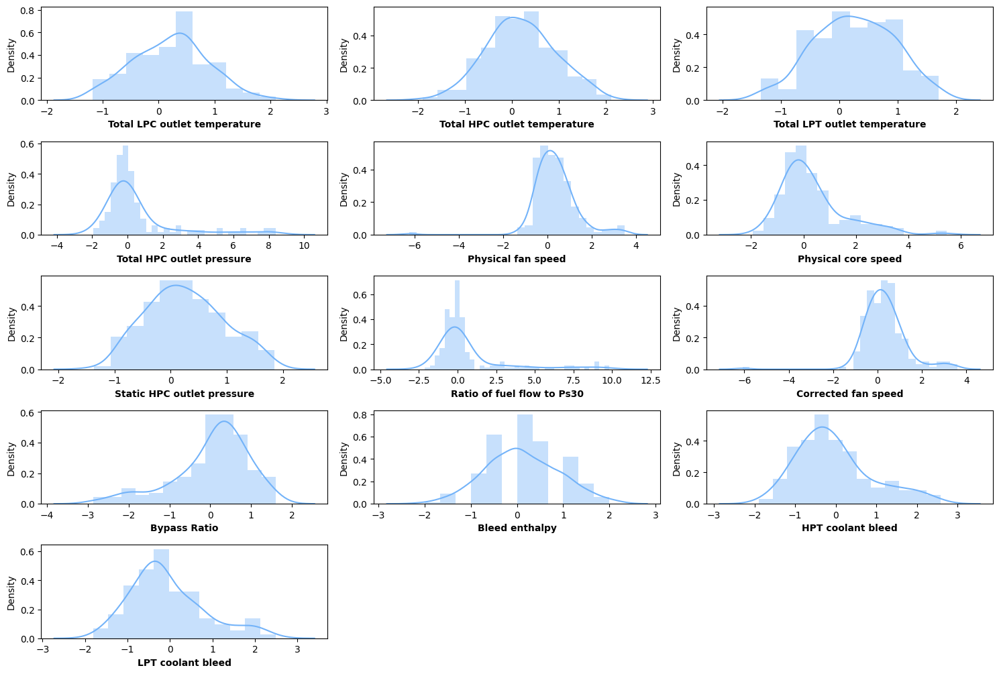

In [77]:
## Let's have a look at the distribution of sensors data for X_train
plt.figure(figsize=(15, 100))

for i, col in enumerate(X_test.columns[0:13]):
    plt.subplot(50, 3, i+1)
    sns.distplot(x=X_test[col], color='#73b3f9')
    plt.xlabel(col, weight='bold')
    plt.tight_layout()

In [63]:
model_performance = pd.DataFrame(columns=['R2','RMSE', 'MSE', 'MAE', 'training_time','prediction_time','total_time'])

In [64]:
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
import xgboost as xb
from catboost import CatBoostRegressor

In [70]:
## Defining Custom Error Function
import math
def score(y_pred, y_true, a1=10, a2=13):
    score=0
    diff = y_pred - y_true
    for i in diff:
        if i >= 0:
            score+=math.exp(i/a2) - 1
        else:
            score+=math.exp(-i/a1) - 1
    return score

In [71]:
def plot_result(y_true,y_pred):
    rcParams['figure.figsize'] = 12,10
    plt.plot(y_pred)
    plt.plot(y_true)
    plt.tick_params(axis='x', which='both', bottom=False, top=False,labelbottom=False)
    plt.ylabel('RUL')
    plt.xlabel('training samples')
    plt.legend(('Predicted', 'True'), loc='upper right')
    plt.title('COMPARISION OF Real and Predicted values')
    plt.show()
    return


In [65]:
models = {
    "SVR":SVR(),
    "KNeighborsRegressor":KNeighborsRegressor(),
    "RandomForestRegressor":RandomForestRegressor(),
    "GradientBoostingRegressor":GradientBoostingRegressor(),
    "AdaBoostRegressor":AdaBoostRegressor(),
    "XGBRegressor":xb.XGBRegressor(),
    "CatBoostRegressor":CatBoostRegressor()
}

In [66]:
def evaluate_model(true, predicted, model_name, start_time, end_training, end_prediction):
    MAE = mean_absolute_error(true, predicted)
    MSE = mean_squared_error(true, predicted)
    RMSE = np.sqrt(MSE)
    r2_square = r2_score(true, predicted)

    print(model_name)
    print("R2 Score:", r2_square)
    print("RMSE:", RMSE)
    print("MSE:", MSE)
    print("MAE:", MAE)
    print("="*35)
    print("\n")

    model_performance.loc[model_name] = [r2_square, RMSE, MSE, MAE, end_training-start_time, end_prediction-end_training, end_prediction-start_time]

In [67]:
def model_training(X_train, y_train, X_test, y_test, models):

  for i in range(len(models)):
    start_time = time.time()
    model = list(models.values())[i]
    model.fit(X_train, y_train)
    end_training = time.time()

    ## Make prediction
    y_pred = model.predict(X_test)
    end_prediction = time.time()

    evaluate_model(y_test, y_pred, list(models.keys())[i], start_time, end_training, end_prediction)


In [68]:
model_training(X_train, y_train, X_test, y_test, models)

SVR
R2 Score: 0.3382141264325329
RMSE: 33.74067150450394
MSE: 1138.4329135748444
MAE: 27.65565838025533


KNeighborsRegressor
R2 Score: -0.07082636435909428
RMSE: 42.91948508544808
MSE: 1842.0822
MAE: 28.769000000000002


RandomForestRegressor
R2 Score: 0.32060417286249454
RMSE: 34.18663954675861
MSE: 1168.7263235
MAE: 23.64525


GradientBoostingRegressor
R2 Score: 0.2486459067405309
RMSE: 35.951523893479184
MSE: 1292.5120702634047
MAE: 24.917807174001922


AdaBoostRegressor
R2 Score: -1.0879327261009837
RMSE: 59.93123483881981
MSE: 3591.7529093057697
MAE: 50.50974133769571


XGBRegressor
R2 Score: 0.18091074889858993
RMSE: 37.53708888600704
MSE: 1409.0330420359935
MAE: 25.118181079030037


Learning rate set to 0.074803
0:	learn: 83.7126778	total: 60.8ms	remaining: 1m
1:	learn: 80.0547839	total: 68ms	remaining: 33.9s
2:	learn: 76.7607854	total: 74.5ms	remaining: 24.8s
3:	learn: 73.6986797	total: 81ms	remaining: 20.2s
4:	learn: 70.9526947	total: 87.1ms	remaining: 17.3s
5:	learn: 68.4769

In [123]:
## Before Adding Both DataFrame
model_performance.head(10)

,R2,RMSE,MSE,MAE,training_time,prediction_time,total_time
SVR,0.300058,34.766492,1208.708946,28.068489,26.779202,0.146827,26.926029
KNeighborsRegressor,0.474412,30.126759,907.621600,22.048000,0.034720,0.003434,0.038153
RandomForestRegressor,0.605553,26.099029,681.159320,19.195400,19.544150,0.012972,19.557122
GradientBoostingRegressor,0.625686,25.424214,646.390666,18.233041,5.120207,0.001835,5.122042
AdaBoostRegressor,0.246159,36.080255,1301.784811,29.274455,0.762009,0.002821,0.764831
XGBRegressor,0.468704,30.289914,917.478880,21.300255,0.293934,0.004233,0.298167
CatBoostRegressor,0.565849,27.381064,749.722688,19.570705,3.887180,0.002083,3.889263


In [69]:
model_performance.head(10)

,R2,RMSE,MSE,MAE,training_time,prediction_time,total_time
SVR,0.338214,33.740672,1138.432914,27.655658,242.670472,0.599672,243.270145
KNeighborsRegressor,-0.070826,42.919485,1842.082200,28.769000,0.076970,0.006920,0.083890
RandomForestRegressor,0.320604,34.186640,1168.726324,23.645250,45.994164,0.022040,46.016204
GradientBoostingRegressor,0.248646,35.951524,1292.512070,24.917807,11.183485,0.002182,11.185667
AdaBoostRegressor,-1.087933,59.931235,3591.752909,50.509741,4.911768,0.005955,4.917723
XGBRegressor,0.180911,37.537089,1409.033042,25.118181,0.438400,0.004618,0.443018
CatBoostRegressor,0.265138,35.554781,1264.142452,23.792255,6.164803,0.005642,6.170445


In [97]:
## Let's do hyperparameter tunning for RandomForestRegressor
import optuna
from sklearn.model_selection import cross_val_score

def objective(trial):
  ## Define hyperparameters to optimize
  n_estimators = trial.suggest_int("n_estimeters", 50, 1000)
  max_depth = trial.suggest_int("max_depth", 5, 20)
  min_samples_split = trial.suggest_int('min_samples_split', 2, 1500)
  min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 70)
  
  ## Creating RandomForestRegressor with the suggested hyperparameters
  regressor_RFR = RandomForestRegressor(
      n_estimators=n_estimators,
      max_depth=max_depth,
      min_samples_split=min_samples_split,
      min_samples_leaf=min_samples_leaf,
      max_features='sqrt',
      n_jobs=-1,
      verbose=0,
      random_state=42
  )

  ## Train the model
  regressor_RFR.fit(X_train, y_train)

  ## Make predictions on the test set
  y_pred = regressor_RFR.predict(X_test)

  ## Calculate the R2 Square as the objective to maximize
  r2_square = r2_score(y_test, y_pred)

  return r2_square

In [ ]:
## Create a study and optimize
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=120)

best_params = study.best_params
print("Best Hyperparameters:", best_params)

In [ ]:
best_score = study.best_value
print("Best Score:", best_score)

In [ ]:
model_RFR = RandomForestRegressor(
    **best_params,
    verbose=0,
    max_features='sqrt',
    n_jobs=-1,
    random_state=42
)

model_RFR.fit(X_train, y_train)

In [ ]:
y_pred = model_RFR.predict(X_test)

r2_square = r2_score(y_test, y_pred)
print("Accuracy of RandomForestRegressor: {:.2f}".format(r2_square*100))

In [ ]:
plot_result(y_true=y_test, y_pred=y_pred)

GradientBoostingRegressor Parameters to consider for tuning:

- min_samples_split
- min_samples_leaf or min_samples_fraction_leaf
- max_depth or max_leaf_nodes (if max_leaf_nodes defined than GBM ignores max_depth)
- max_features: As a thumb-rule, square root of the total number of features works great but we should check upto 30-40% of the total number of features.
- learning rate: Generally low values are prefered and if it is low than requires high number of trees (can be fixed)
- n_estimators: should be tune using a particular learning  rate 
- subsample: values lesser than 1 makes the model more robust (typically ~0.8)
- init**
- warm_start**

In [96]:
## Let's do Hyperparameter tunning for GradientBoostingRegressor

def objective(trial):
  ## Define hyperparameter to optimize

  params = {
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 2),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'subsample': trial.suggest_uniform('subsample', 0.4, 1.0),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 1500),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 70),

        'max_depth': trial.suggest_int('max_depth', 3, 10),
      
        'tol': trial.suggest_float('tol', 1e-5, 1e-3),
        'ccp_alpha': trial.suggest_float('ccp_alpha', 0.0, 0.2)
        }

  model = GradientBoostingRegressor(
        **params,
        max_features='sqrt',
        criterion='squared_error',
        warm_start=True,
        verbose=0,
        random_state=40
  )

  model.fit(X_train_FD001, y_train_FD001)

  y_pred = model.predict(X_test_FD001)

  MSE = mean_squared_error(y_test_FD001, y_pred)

  return MSE

In [ ]:
from optuna.samplers import TPESampler
study = optuna.create_study(direction="minimize", pruner=optuna.pruners.SuccessiveHalvingPruner(), sampler=TPESampler())
study.optimize(objective, n_trials=150)

best_params = study.best_params
print("Best Hyperparameters:", best_params)

[I 2024-02-25 10:24:56,352] A new study created in memory with name: no-name-961f1cab-8fbd-462d-b007-6d1298472db3
[I 2024-02-25 10:25:05,374] Trial 0 finished with value: 866.7818895238438 and parameters: {'learning_rate': 0.2213428006308118, 'n_estimators': 354, 'subsample': 0.7103399915342143, 'min_samples_split': 746, 'min_samples_leaf': 21, 'max_depth': 10, 'tol': 0.00090558612634422, 'ccp_alpha': 0.06708162354924212}. Best is trial 0 with value: 866.7818895238438.
[I 2024-02-25 10:25:25,844] Trial 1 finished with value: 615.027957145478 and parameters: {'learning_rate': 0.002634079692522715, 'n_estimators': 988, 'subsample': 0.6278587341442123, 'min_samples_split': 171, 'min_samples_leaf': 39, 'max_depth': 8, 'tol': 0.0009400111060292819, 'ccp_alpha': 0.10067834428006}. Best is trial 1 with value: 615.027957145478.
[I 2024-02-25 10:25:27,951] Trial 2 finished with value: 1330.0624601073685 and parameters: {'learning_rate': 0.0032123973441975924, 'n_estimators': 175, 'subsample': 0

In [ ]:
best_score = study.best_value
print("Least MSE:", best_score)

In [ ]:
model_GDR = GradientBoostingRegressor(**best_params, random_state=40)
model_GDR.fit(X_train_FD001, y_train_FD001)

In [ ]:
y_pred = model_GDR.predict(X_test_FD001)
r2_square = r2_score(y_test_FD001, y_pred)
print("Accuracy of GradientBoostingRegressor: {:.2f}".format(r2_square*100))

In [63]:
import optuna 
from optuna.samplers import TPESampler

def objective(trial):
    
    params = {
        "iterations" : trial.suggest_int("iterations", 100, 1000),
        "learning_rate" : trial.suggest_float("learning_rate", 1e-3, 1e-1, log=True),
        "depth" : trial.suggest_int("depth", 4, 10),
        "boosting_type" : trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
        "bootstrap_type" : trial.suggest_categorical("bootstrap_type", ["Bayesian", "MVS"]),
        "l2_leaf_reg" : trial.suggest_float("l2_leaf_reg", 1e-8, 100.0, log=True),
        "random_strength" : trial.suggest_float("random_strength", 1e-8, 10.0, log=True),
        "bagging_temperature" : trial.suggest_float("bagging_temperature", 0.0, 10.0),
        "od_type" : trial.suggest_categorical("od_type", ["IncToDec", "Iter"]),
        "od_wait" : trial.suggest_int("od_wait", 10, 50),
        "min_data_in_leaf" : trial.suggest_int("min_data_in_leaf",51,120),
    }
    
    model = CatBoostRegressor(
        **params,
        loss_function="RMSE",
        eval_metric="R2",
        task_type='GPU',
        verbose=False
    )
    
    model.fit(X_train_FD001, y_train_FD001)

    y_pred = model.predict(X_test_FD001)

    r2_square = r2_score(y_test_FD001, y_pred)

    return r2_square

In [64]:
study = optuna.create_study(direction="maximize", pruner=optuna.pruners.SuccessiveHalvingPruner(), sampler=TPESampler())
study.optimize(objective, n_trials=100)

best_params = study.best_params
print("Best Hyperparameters:", best_params)

[I 2024-02-25 08:18:16,082] A new study created in memory with name: no-name-e8fe7e80-ee65-449d-8834-5d05e819bc0f
Default metric period is 5 because R2 is/are not implemented for GPU
Metric R2 is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
[I 2024-02-25 08:18:40,182] Trial 0 finished with value: 0.5317857839939363 and parameters: {'iterations': 542, 'learning_rate': 0.002321192605737956, 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS', 'l2_leaf_reg': 7.35933782791254e-07, 'random_strength': 3.818875063349073e-06, 'bagging_temperature': 2.338376816122456, 'od_type': 'IncToDec', 'od_wait': 17, 'min_data_in_leaf': 93}. Best is trial 0 with value: 0.5317857839939363.
Default metric period is 5 because R2 is/are not implemented for GPU
Metric R2 is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
[I 2024-02-25 08:18:44,631] Trial 1 finished with value: 0.509

Best Hyperparameters: {'iterations': 737, 'learning_rate': 0.00334816047737354, 'depth': 8, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bayesian', 'l2_leaf_reg': 1.9249390363531126e-07, 'random_strength': 0.00018782291230674242, 'bagging_temperature': 0.5801089510391069, 'od_type': 'IncToDec', 'od_wait': 41, 'min_data_in_leaf': 109}


In [66]:
best_score = study.best_value
print("Least R2:", best_score)

Least R2: 0.6589502904409495


In [67]:
model_CatBoost = CatBoostRegressor(**best_params, random_state=42)
model_CatBoost.fit(X_train_FD001, y_train_FD001)

0:	learn: 68.7206951	total: 55.3ms	remaining: 40.7s
1:	learn: 68.5621167	total: 94.8ms	remaining: 34.8s
2:	learn: 68.4044059	total: 136ms	remaining: 33.2s
3:	learn: 68.2474369	total: 176ms	remaining: 32.2s
4:	learn: 68.0910045	total: 216ms	remaining: 31.6s
5:	learn: 67.9353469	total: 255ms	remaining: 31s
6:	learn: 67.7803353	total: 296ms	remaining: 30.9s
7:	learn: 67.6259808	total: 339ms	remaining: 30.9s
8:	learn: 67.4723116	total: 380ms	remaining: 30.8s
9:	learn: 67.3193654	total: 418ms	remaining: 30.4s
10:	learn: 67.1672962	total: 458ms	remaining: 30.2s
11:	learn: 67.0152666	total: 499ms	remaining: 30.1s
12:	learn: 66.8641410	total: 537ms	remaining: 29.9s
13:	learn: 66.7137452	total: 577ms	remaining: 29.8s
14:	learn: 66.5642050	total: 615ms	remaining: 29.6s
15:	learn: 66.4151694	total: 652ms	remaining: 29.4s
16:	learn: 66.2665635	total: 690ms	remaining: 29.2s
17:	learn: 66.1191291	total: 728ms	remaining: 29.1s
18:	learn: 65.9721945	total: 769ms	remaining: 29.1s
19:	learn: 65.8258916	

In [70]:
y_pred = model_CatBoost.predict(X_test_FD001)
r2_square = r2_score(y_test_FD001, y_pred)
print("Accuracy of CatBoostRegressor: {:.2f}".format(r2_square*100))

Accuracy of CatBoostRegressor: 65.90
